In [1]:
import os

import umap
%load_ext autoreload
%autoreload 1
os.environ["CUDA_VISIBLE_DEVICES"] = "2"

%aimport models.adaptation
%aimport HookedRecursiveCNN
%aimport modules.divisive_norm
from models.adaptation import Adaptation
from models.HookedRecursiveCNN import HookedRecursiveCNN
from utils.visualization import visualize_first_batch_with_timesteps
from torch.utils.data import DataLoader
from temporal_datasets.noisy_dataloader import NoisyTemporalDataset
from functools import partial
from utils.transforms import RandomRepeatedNoise, MeanFlat
from modules.divisive_norm_group import DivisiveNormGroup
from modules.divisive_norm import DivisiveNorm
from modules.exponential_decay import ExponentialDecay
from modules.lateral_recurrence import LateralRecurrence
from pytorch_lightning.loggers import CSVLogger
import torchvision.transforms as transforms
import json
import pytorch_lightning as pl
import torch

In [2]:
from torch.utils.data import Dataset


class EvalDataWrapper(Dataset):
    """Simple Wrapper that adds contrast and repeated noise information to the dataset to power
    the evaluation metrics"""

    def __init__(self, dataset, contrast, rep_noise):
        self.dataset = dataset
        self.contrast = float(contrast)
        self.rep_noise = bool(rep_noise)

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        x, y = self.dataset[idx]
        if type(idx) == int:
            idx = torch.tensor([idx])
        contrast = torch.full_like(idx, self.contrast, dtype=torch.float)
        rep_noise = torch.full_like(idx, self.rep_noise, dtype=torch.bool)
        return x, y, contrast, rep_noise

In [4]:
from utils.transforms import Identity


def worker_init_fn(worker_id):
    os.sched_setaffinity(0, range(os.cpu_count())) 

def get_dataloaders(dataset_name='fashion_mnist', noise_component='test', with_ground_truth=False, noise_type='uniform', noise_offset=0, noise_mean_offset=0, noise_std=0):
    dataset = dataset_name
    contrast = 'random'
    repeat_noise = True

    noise_transformer = RandomRepeatedNoise(contrast=contrast, repeat_noise_at_test=repeat_noise,
                                            noise_type=noise_type, noise_offset=noise_offset, noise_mean_offset=noise_mean_offset, noise_std=noise_std)
    noise_transformer_test = partial(noise_transformer, stage='test')
    first_in_line_transformer = partial(noise_transformer, stage='test', first_in_line=True)
    transform = transforms.Compose([
            transforms.ToTensor(),
            # transforms.Normalize((0.5,), (0.5,))
        ])
    if with_ground_truth:
        timestep_transforms = [Identity()] + [noise_transformer] + [MeanFlat()] + [first_in_line_transformer]
    else:
        timestep_transforms = [noise_transformer] + [MeanFlat()] + [first_in_line_transformer]
    # Create instances of the Fashion MNIST dataset
    train_dataset = NoisyTemporalDataset('train', dataset=dataset, transform=transform,
                                         img_to_timesteps_transforms=timestep_transforms)
    
    test_sets = []
    
    for repeat_noise in [True, False]:
        # for the val set to power evals, we need to explicitly add contrast information to every sample
        cs = [0.2, 0.4, 0.6, 0.8, 1.0] if contrast == 'random' else [contrast]
        for c in cs:
            noise_transformer = RandomRepeatedNoise(contrast=c,
                                                    repeat_noise_at_test=repeat_noise, noise_component=noise_component,
                                                    noise_type=noise_type, noise_offset=noise_offset, noise_mean_offset=noise_mean_offset, noise_std=noise_std)
            noise_transformer_test = partial(noise_transformer, stage='test')
            first_in_line_transformer = partial(noise_transformer, stage='test', first_in_line=True)
            timestep_transforms = [noise_transformer] + [MeanFlat()] + [first_in_line_transformer]
            test_sets.append(EvalDataWrapper(NoisyTemporalDataset('test', dataset=dataset,
                                                                  transform=transform,
                                                                  img_to_timesteps_transforms=timestep_transforms),
                                             contrast=c, rep_noise=repeat_noise))
    test_dataset = torch.utils.data.ConcatDataset(test_sets)
    
    # Create the DataLoaders for the Fashion MNIST dataset
    train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=5, worker_init_fn=worker_init_fn)
    test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False, num_workers=5, worker_init_fn=worker_init_fn)
    return train_loader, test_loader, train_dataset, test_dataset

In [ ]:
train_loader, test_loader, train_dataset, test_dataset = get_dataloaders('fashion_mnist')

In [4]:
# load model
with open('config.json', 'r') as f:
    config = json.load(f)
hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_fmnist'], ExponentialDecay, 
                                [
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False}
  ]
                                )
model = Adaptation.load_from_checkpoint(
    'learned_models/baseline_generalization_ExponentialDecay_contrast_random_repeat_noise_True_epoch_10.ckpt', model=hooked_cnn)

models = {}
models['baseline'] = model

additive_hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_fmnist'], ExponentialDecay,
                                config['adaptation_kwargs_additive'])
additive_model = Adaptation.load_from_checkpoint(
    'learned_models/generalization_ExponentialDecay_contrast_random_repeat_noise_True_epoch_10.ckpt',
    model=additive_hooked_cnn)
models['additive'] = additive_model

divisive_hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_fmnist'], DivisiveNorm,
                                config['adaptation_kwargs_div_norm'])
divisive_model = Adaptation.load_from_checkpoint(
    'learned_models/generalization_DivisiveNorm_contrast_random_repeat_noise_True_epoch_10.ckpt',
    model=divisive_hooked_cnn)
models['divisive'] = divisive_model


wandb: Currently logged in as: georglange. Use `wandb login --relogin` to force relogin


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


baseline


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

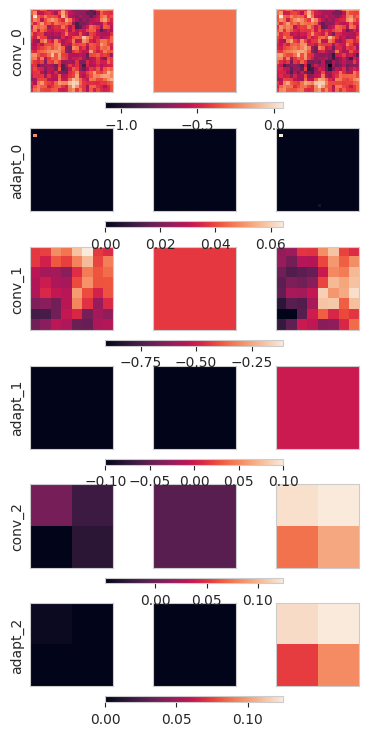

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.6255000233650208     │
│       acc/0.2_True        │    0.6270999908447266     │
│       acc/0.4_False       │    0.7346000075340271     │
│       acc/0.4_True        │     0.73580002784729      │
│       acc/0.6_False       │     0.769599974155426     │
│       acc/0.6_True        │    0.7700999975204468     │
│       acc/0.8_False       │    0.7867000102996826     │
│       acc/0.8_True        │    0.7857000231742859     │
│       acc/1.0_False       │    0.7976999878883362     │
│       acc/1.0_True        │    0.7947999835014343     │
│       acc_diff/0.2        │   0.0015999999595806003   │
│       acc_diff/0.4        │   0.0012000000569969416   │
│       acc_diff/0.6        │   0.0005000000237487257   │
│       acc_diff/0.8        │  -0.0010000000474974513   │
│       acc_diff/1.0        │   -0.002899999963119626   │
│   cum_actv_diff/0.2_l0    │  -4.597823499352671e-05   │
│   cum_actv_diff/0.2_l1    │  -0.00016982796660158783  │
│   cum_actv_diff/0.2_l2    │  -0.00015145917132031173  │
│   cum_actv_diff/0.4_l0    │   4.079269274370745e-06   │
│   cum_actv_diff/0.4_l1    │  2.6541911211097613e-05   │
│   cum_actv_diff/0.4_l2    │  2.3018781575956382e-05   │
│   cum_actv_diff/0.6_l0    │  -1.0427648703625891e-05  │
│   cum_actv_diff/0.6_l1    │  -2.3981569029274397e-05  │
│   cum_actv_diff/0.6_l2    │   6.484377991000656e-06   │
│   cum_actv_diff/0.8_l0    │   3.346566518303007e-05   │
│   cum_actv_diff/0.8_l1    │   4.211049235891551e-05   │
│   cum_actv_diff/0.8_l2    │   0.0001257513795280829   │
│   cum_actv_diff/1.0_l0    │  4.1196301026502624e-05   │
│   cum_actv_diff/1.0_l1    │  0.00013166172720957547   │
│   cum_actv_diff/1.0_l2    │  0.00014461226237472147   │
│         test_acc          │    0.7427600026130676     │
│         test_loss         │    0.6912083029747009     │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


additive


Testing: 0it [00:00, ?it/s]

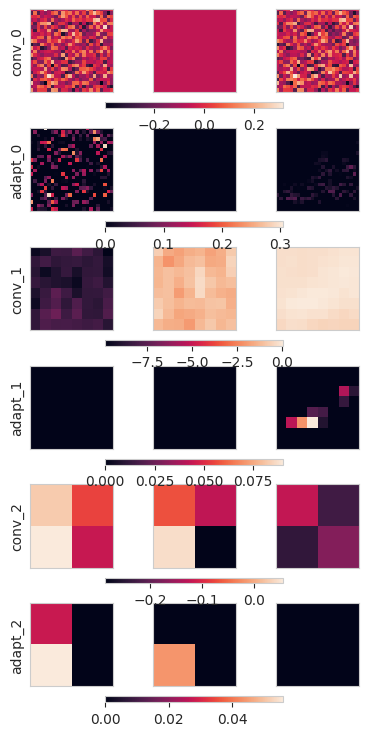

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.18970000743865967    │
│       acc/0.2_True        │    0.8597999811172485     │
│       acc/0.4_False       │    0.3294999897480011     │
│       acc/0.4_True        │    0.8636999726295471     │
│       acc/0.6_False       │    0.4666000008583069     │
│       acc/0.6_True        │    0.8651000261306763     │
│       acc/0.8_False       │    0.5817999839782715     │
│       acc/0.8_True        │    0.8644999861717224     │
│       acc/1.0_False       │    0.6571999788284302     │
│       acc/1.0_True        │    0.8639000058174133     │
│       acc_diff/0.2        │    0.6700999736785889     │
│       acc_diff/0.4        │    0.5342000126838684     │
│       acc_diff/0.6        │     0.398499995470047     │
│       acc_diff/0.8        │    0.2827000021934509     │
│       acc_diff/1.0        │    0.20669999718666077    │
│   cum_actv_diff/0.2_l0    │   0.041146066039800644    │
│   cum_actv_diff/0.2_l1    │  -0.0012522988254204392   │
│   cum_actv_diff/0.2_l2    │  -0.0034088725224137306   │
│   cum_actv_diff/0.4_l0    │   0.034452397376298904    │
│   cum_actv_diff/0.4_l1    │   -0.004723710007965565   │
│   cum_actv_diff/0.4_l2    │   -0.009494708850979805   │
│   cum_actv_diff/0.6_l0    │   0.028522321954369545    │
│   cum_actv_diff/0.6_l1    │   -0.007108903955668211   │
│   cum_actv_diff/0.6_l2    │   -0.01471665594726801    │
│   cum_actv_diff/0.8_l0    │    0.02367093414068222    │
│   cum_actv_diff/0.8_l1    │   -0.008473586291074753   │
│   cum_actv_diff/0.8_l2    │   -0.017522970214486122   │
│   cum_actv_diff/1.0_l0    │    0.0196014866232872     │
│   cum_actv_diff/1.0_l1    │   -0.008882180787622929   │
│   cum_actv_diff/1.0_l2    │   -0.01825086399912834    │
│         test_acc          │    0.6541799902915955     │
│         test_loss         │     1.233538031578064     │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


divisive


Testing: 0it [00:00, ?it/s]

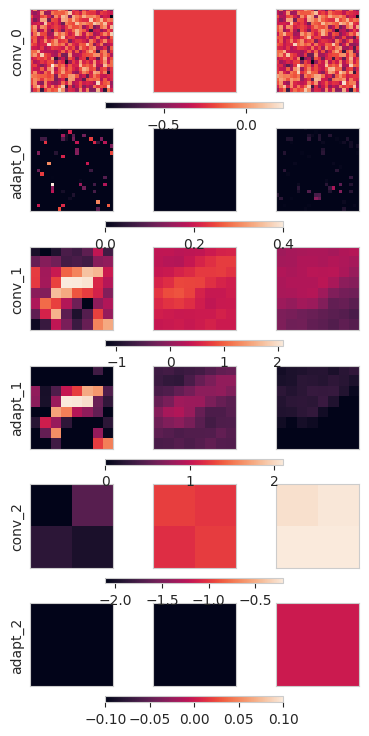

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.31769999861717224    │
│       acc/0.2_True        │    0.7950000166893005     │
│       acc/0.4_False       │    0.5135999917984009     │
│       acc/0.4_True        │     0.826200008392334     │
│       acc/0.6_False       │    0.6541000008583069     │
│       acc/0.6_True        │     0.829800009727478     │
│       acc/0.8_False       │     0.732200026512146     │
│       acc/0.8_True        │    0.8334000110626221     │
│       acc/1.0_False       │    0.7623000144958496     │
│       acc/1.0_True        │    0.8361999988555908     │
│       acc_diff/0.2        │    0.4772999882698059     │
│       acc_diff/0.4        │    0.3125999867916107     │
│       acc_diff/0.6        │    0.17569999396800995    │
│       acc_diff/0.8        │    0.10119999945163727    │
│       acc_diff/1.0        │    0.0738999992609024     │
│   cum_actv_diff/0.2_l0    │    0.03740139678120613    │
│   cum_actv_diff/0.2_l1    │   0.019634488970041275    │
│   cum_actv_diff/0.2_l2    │   -0.01674841344356537    │
│   cum_actv_diff/0.4_l0    │    0.03603801503777504    │
│   cum_actv_diff/0.4_l1    │   0.012806227430701256    │
│   cum_actv_diff/0.4_l2    │   -0.01531117781996727    │
│   cum_actv_diff/0.6_l0    │   0.033518657088279724    │
│   cum_actv_diff/0.6_l1    │   0.008070435374975204    │
│   cum_actv_diff/0.6_l2    │   -0.012062701396644115   │
│   cum_actv_diff/0.8_l0    │    0.03067580610513687    │
│   cum_actv_diff/0.8_l1    │   0.005162633955478668    │
│   cum_actv_diff/0.8_l2    │   -0.007534215226769447   │
│   cum_actv_diff/1.0_l0    │   0.027485830709338188    │
│   cum_actv_diff/1.0_l1    │   0.003823772305622697    │
│   cum_actv_diff/1.0_l2    │  -0.0029410100542008877   │
│         test_acc          │    0.7100499868392944     │
│         test_loss         │    0.8357818722724915     │
└───────────────────────────┴───────────────────────────┘

<Axes: xlabel='name', ylabel='test_acc'>

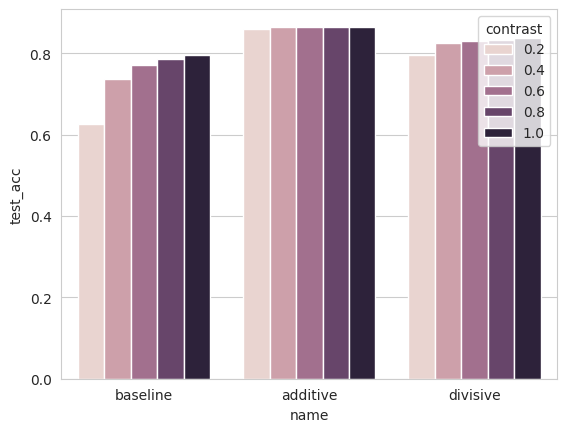

In [5]:
wandb_logger = pl.loggers.WandbLogger(project='ai-thesis', config=config,
                                                      name=f'del')
trainer = pl.Trainer(logger=wandb_logger)
results = {'name': [], 'test_acc': [], 'contrast': []}
for name, model in models.items():
    print(name)
    res = trainer.test(model, test_loader)
    for contrast in [0.2, 0.4, 0.6, 0.8, 1.0]:
        results['name'].append(name)
        results['test_acc'].append(res[0][f'acc/{contrast}_True'])
        results['contrast'].append(contrast)
    
import seaborn as sns

sns.barplot(x='name', y='test_acc', data=results, hue='contrast')

<Axes: xlabel='name', ylabel='test_acc'>

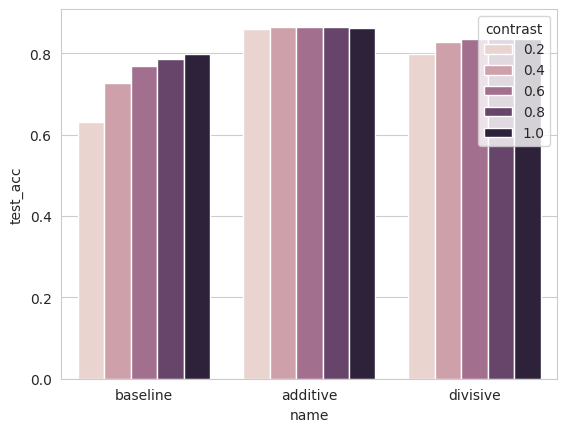

In [50]:
sns.barplot(x='name', y='test_acc', data=results, hue='contrast')

In [16]:
from tqdm import tqdm


def get_activations(layer, loader):
    all_activations = []
    labels = []
    for batch in tqdm(loader):
        x, y = batch
        l, cache = hooked_cnn.run_with_cache(x)
        activations = cache[f'hks.adapt_{layer}_2']
        all_activations.append(activations)
        labels.append(y)
    return torch.cat(all_activations, dim=0), torch.cat(labels, dim=0)
actvs, labels = get_activations('1', train_loader)
actvs.shape, labels.shape

100%|██████████| 938/938 [00:31<00:00, 29.41it/s]


(torch.Size([60000, 32, 8, 8]), torch.Size([60000]))

In [29]:
actvs = actvs.view(actvs.shape[0], -1).detach().numpy()

100%|██████████| 938/938 [00:34<00:00, 27.25it/s]


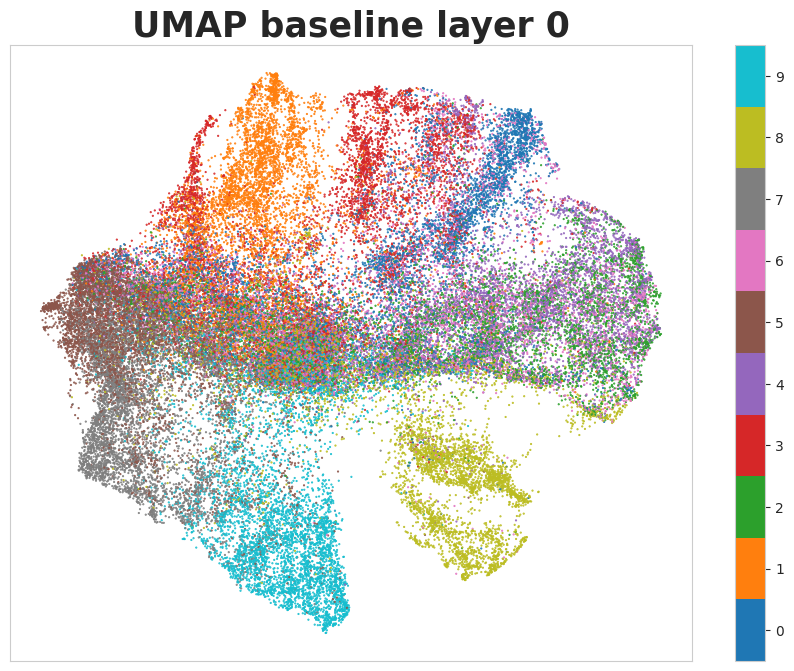

100%|██████████| 938/938 [00:35<00:00, 26.48it/s]


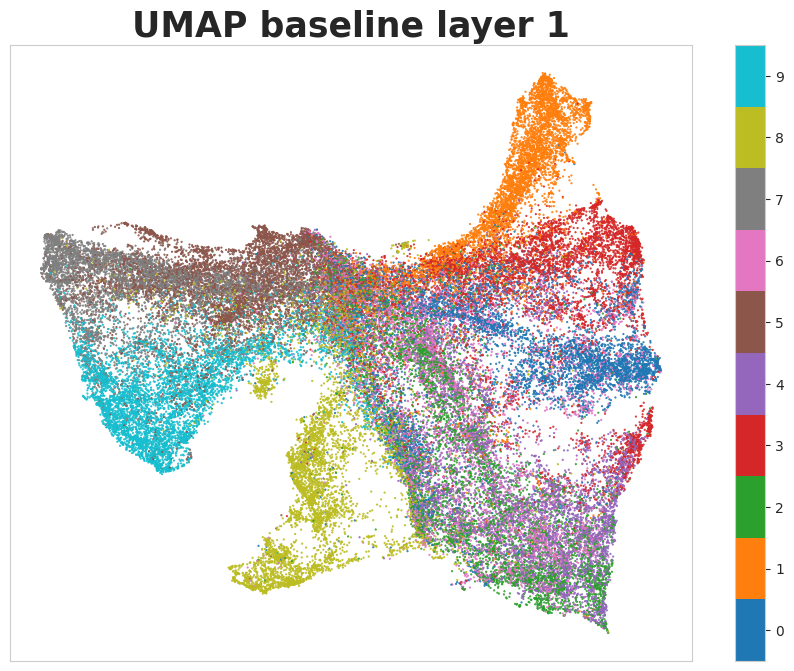

100%|██████████| 938/938 [00:33<00:00, 28.25it/s]


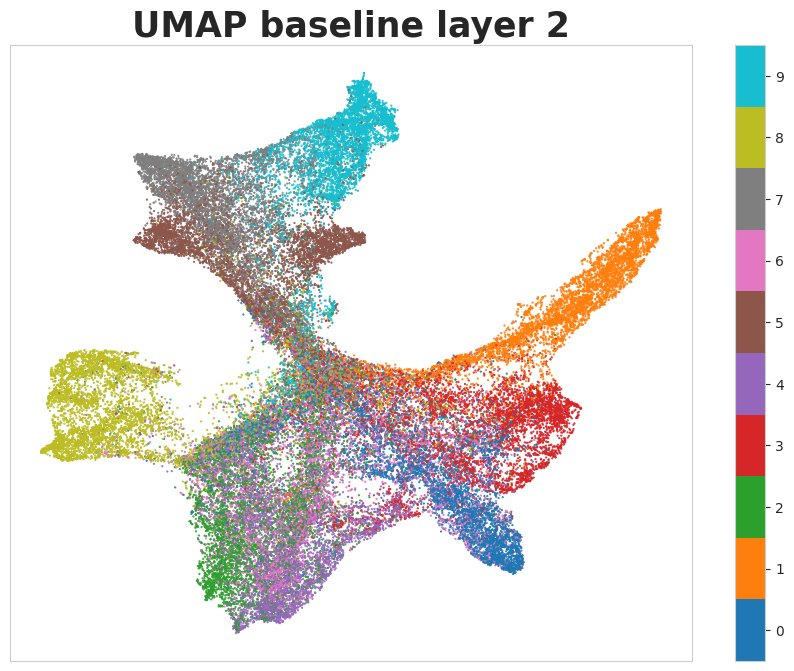

In [32]:
from matplotlib import pyplot as plt

import numpy as np
import umap

umap_hparams = {'n_neighbors':5,
                'min_dist':0.1,
                'n_components':2,
                'metric':'euclidean'}

for layer in range(3):
    actvs, labels = get_activations(layer, train_loader)
    actvs = actvs.view(actvs.shape[0], -1).detach().numpy()

    fig, ax = plt.subplots(figsize=(11,8), constrained_layout=False)
    ax.set(xticks=[], yticks=[])
    
    umap_embedding = umap.UMAP(n_neighbors=umap_hparams['n_neighbors'], min_dist=umap_hparams['min_dist'], n_components=umap_hparams['n_components'], metric=umap_hparams['metric']).fit_transform(actvs)
    scatter = ax.scatter(x = umap_embedding[:,0], y = umap_embedding[:,1], s=0.3, c=labels, cmap='tab10')
    
    cbar = plt.colorbar(scatter, boundaries=np.arange(11)-0.5)
    cbar.set_ticks(np.arange(10))
    cbar.set_ticklabels(np.arange(10))
    
    plt.title(f'UMAP baseline layer {layer}', fontsize=25, fontweight='bold')
    plt.show()

In [33]:
def get_activations_with_contrast_labels(layer, loader):
    all_activations = []
    labels = []
    for batch in tqdm(loader):
        x, _, contrast, _ = batch
        l, cache = hooked_cnn.run_with_cache(x)
        activations = cache[f'hks.adapt_{layer}_2']
        all_activations.append(activations)
        labels.append(contrast)
    return torch.cat(all_activations, dim=0), torch.cat(labels, dim=0)


100%|██████████| 1563/1563 [01:16<00:00, 20.34it/s]


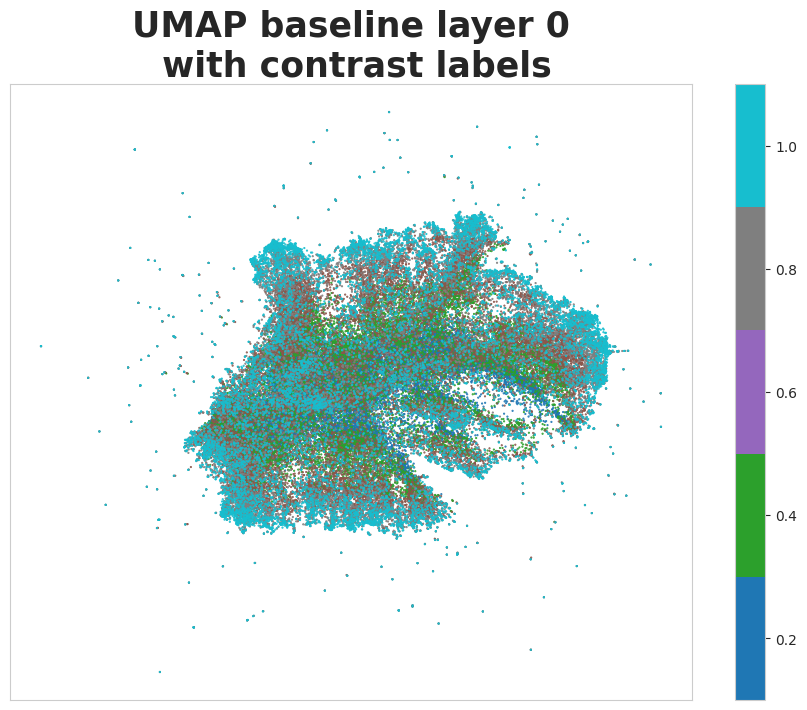


100%|██████████| 1563/1563 [01:04<00:00, 24.16it/s]


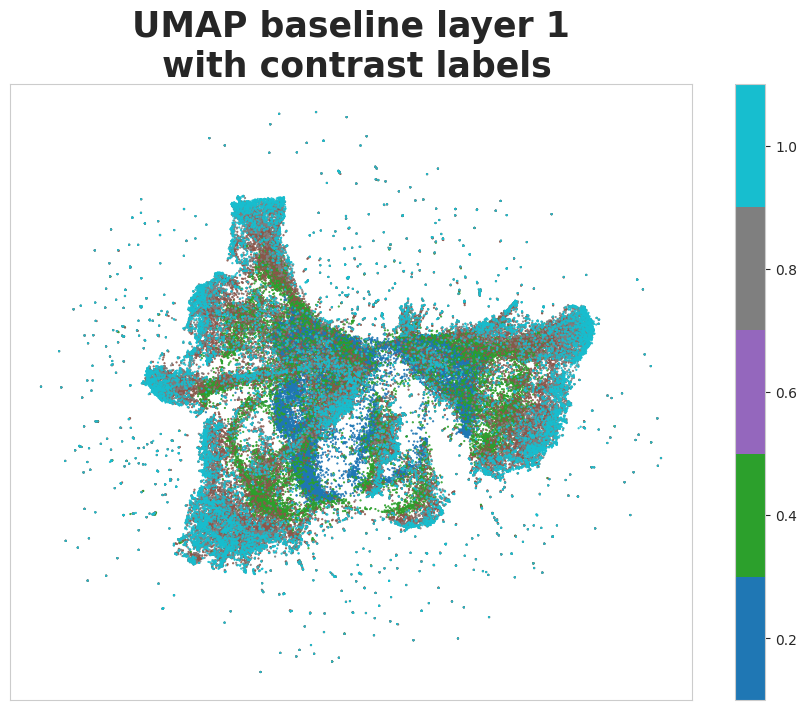


100%|██████████| 1563/1563 [00:59<00:00, 26.26it/s]


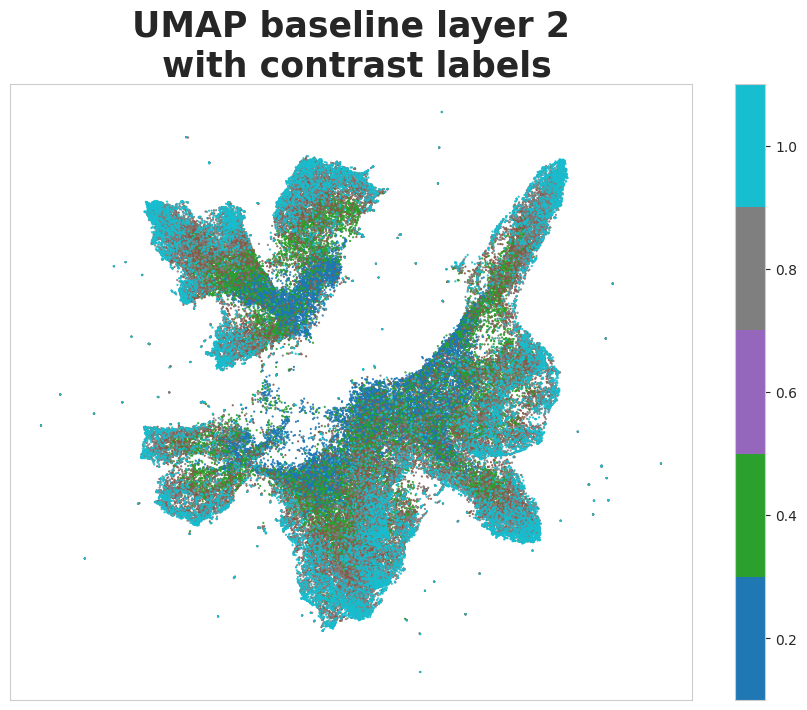


100%|██████████| 1563/1563 [01:29<00:00, 17.56it/s]


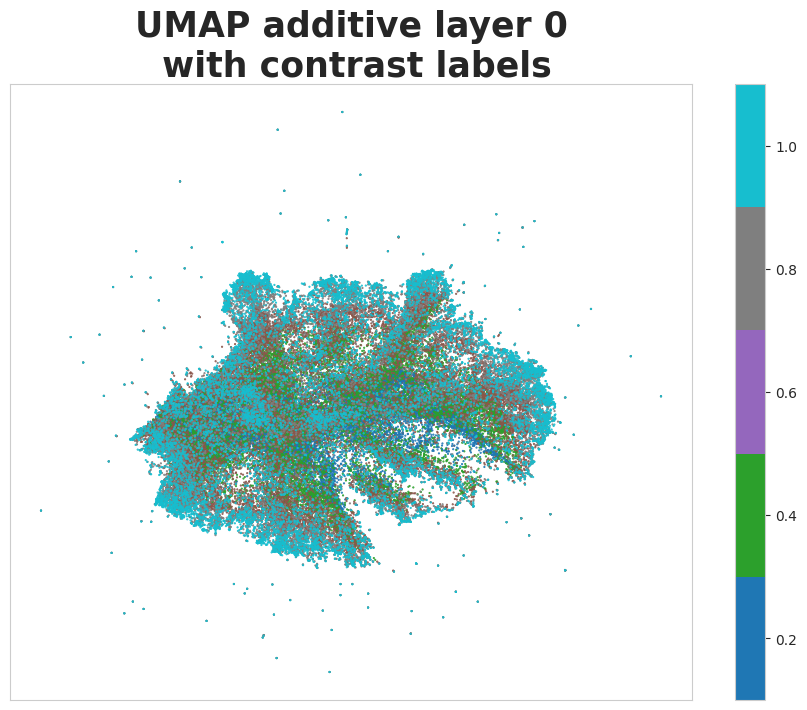


100%|██████████| 1563/1563 [01:05<00:00, 23.95it/s]


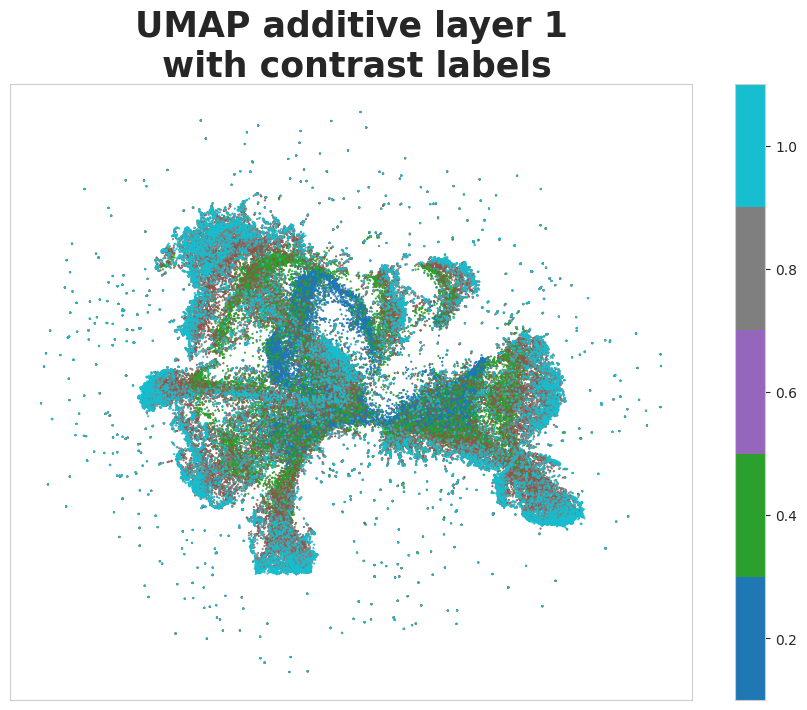


100%|██████████| 1563/1563 [00:58<00:00, 26.72it/s]


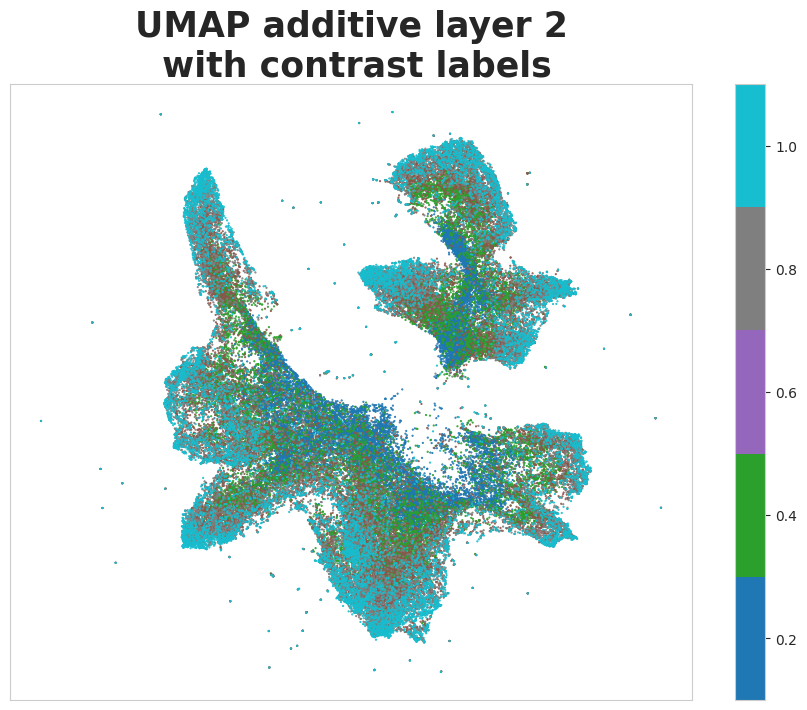


100%|██████████| 1563/1563 [01:27<00:00, 17.84it/s]


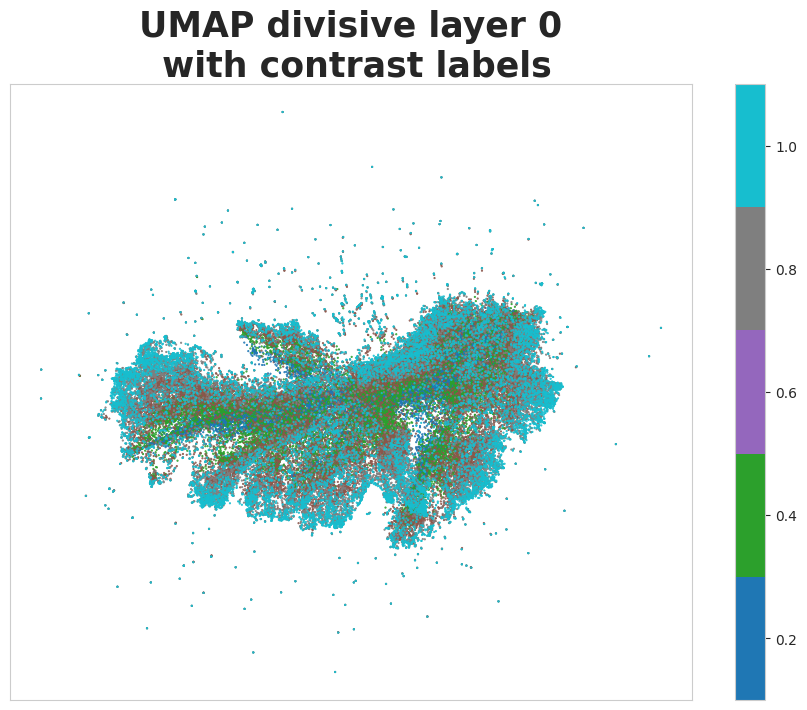


100%|██████████| 1563/1563 [01:04<00:00, 24.28it/s]


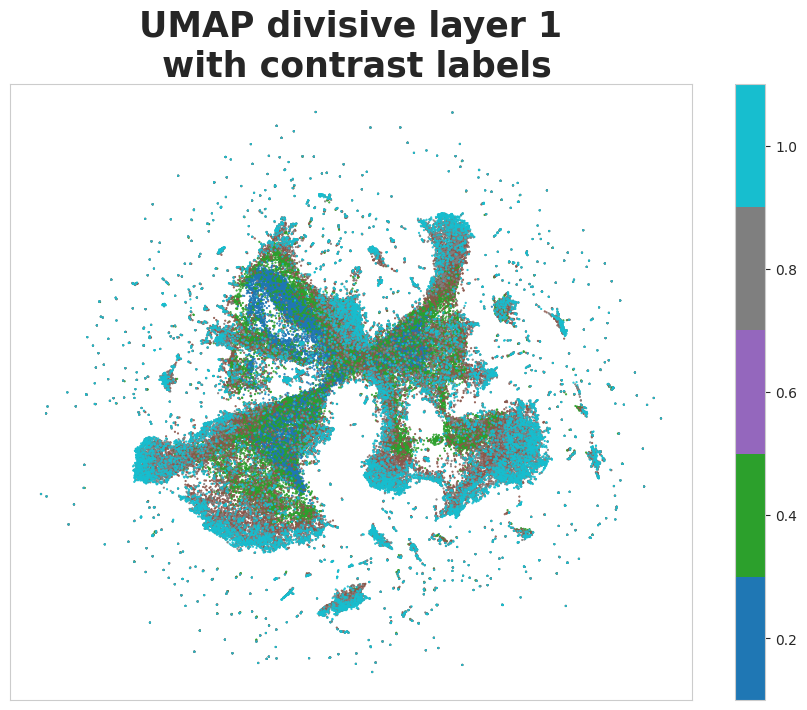


100%|██████████| 1563/1563 [00:59<00:00, 26.06it/s]


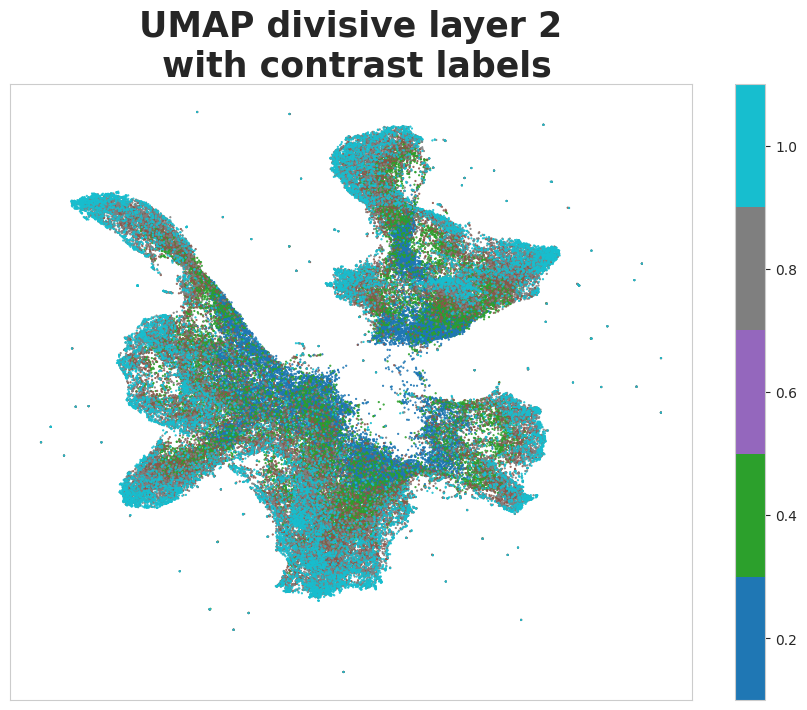

In [51]:
for name, model in models.items():
    for layer in range(3):
        actvs, labels = get_activations_with_contrast_labels(layer, test_loader)
        actvs = actvs.view(actvs.shape[0], -1).detach().numpy()
    
        fig, ax = plt.subplots(figsize=(11,8), constrained_layout=False)
        ax.set(xticks=[], yticks=[])
        
        umap_embedding = umap.UMAP(n_neighbors=umap_hparams['n_neighbors'], min_dist=umap_hparams['min_dist'], n_components=umap_hparams['n_components'], metric=umap_hparams['metric']).fit_transform(actvs)
        scatter = ax.scatter(x = umap_embedding[:,0], y = umap_embedding[:,1], s=0.3, c=labels, cmap='tab10')
        
        cbar = plt.colorbar(scatter, boundaries=[0.1, 0.3, 0.5, 0.7, 0.9, 1.1])
        cbar.set_ticks([0.2, 0.4, 0.6, 0.8, 1.0])
        cbar.set_ticklabels([0.2, 0.4, 0.6, 0.8, 1.0])
        
        plt.title(f'UMAP {name} layer {layer}\n with contrast labels', fontsize=25, fontweight='bold')
        plt.show()

In [1]:
additive_hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_fmnist'], ExponentialDecay,
                                config['adaptation_kwargs_additive'])
additive_model = Adaptation.load_from_checkpoint(
    'learned_models/generalization_ExponentialDecay_contrast_random_repeat_noise_True_epoch_10.ckpt',
    model=additive_hooked_cnn)
wandb_logger = pl.loggers.WandbLogger(project='ai-thesis', config=config,
                                      name=f'del')
trainer = pl.Trainer(logger=wandb_logger)
trainer.test(model, test_loader)

In [13]:
import torchvision

def actvs_grid(model, dataset, idx, layer, normalize=False):
    # subplots
    fig, axs = plt.subplots(1, 5, figsize=(27, 6))
    for i in [0, 10000, 20000, 30000, 40000]:
        l, cache = model.model.run_with_cache(dataset[i + idx][0].unsqueeze(0))
        actvs = cache[f'hks.adapt_{layer}_2']
        grid = torchvision.utils.make_grid(actvs.squeeze().unsqueeze(1), nrow=10, padding=0, normalize=normalize, scale_each=False)
        # put channel last
        grid = grid.permute(1, 2, 0)
        ax = axs[i // 10000]
        ax.imshow(grid)
        width = actvs.shape[-1]
        num_maps = actvs.shape[1]
        # put gridlines every 28 px
        ax.set_xticks(np.arange(0, width * 10, width))
        ax.set_yticks(np.arange(0, (num_maps // 10 + 1) * width, width))

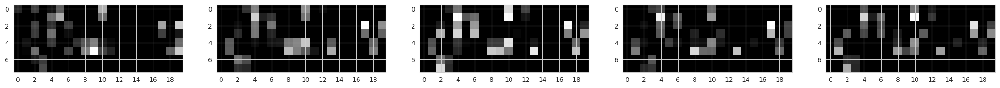

In [154]:
actvs_grid(models['baseline'], test_dataset, 1, 2)

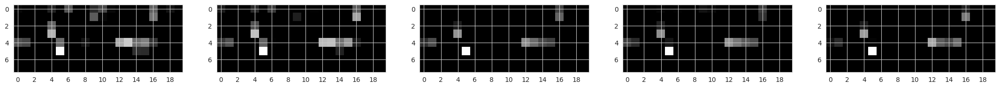

In [155]:
actvs_grid(models['additive'], test_dataset, 1, 2)

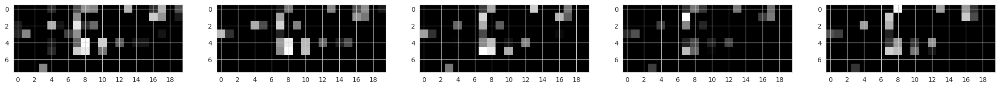

In [156]:
actvs_grid(models['divisive'], test_dataset, 1, 2)

# Train on 0.2, 1.0, test on rest

In [4]:
# load model
with open('config.json', 'r') as f:
    config = json.load(f)
hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_fmnist'], ExponentialDecay, 
                                [
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False}
  ]
                                )
model = Adaptation.load_from_checkpoint(
    'learned_models/baseline_generalization_ExponentialDecay_contrast_[0.2, 1.0]_repeat_noise_True_epoch_10.ckpt', model=hooked_cnn)

models = {}
models['baseline'] = model

additive_hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_fmnist'], ExponentialDecay,
                                config['adaptation_kwargs_additive'])
additive_model = Adaptation.load_from_checkpoint(
    'learned_models/generalization_ExponentialDecay_contrast_[0.2, 1.0]_repeat_noise_True_epoch_10.ckpt',
    model=additive_hooked_cnn)
models['additive'] = additive_model

divisive_hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_fmnist'], DivisiveNorm,
                                config['adaptation_kwargs_div_norm'])
divisive_model = Adaptation.load_from_checkpoint(
    'learned_models/generalization_DivisiveNorm_contrast_[0.2, 1.0]_repeat_noise_True_epoch_10.ckpt',
    model=divisive_hooked_cnn)
models['divisive'] = divisive_model


In [11]:
train_loader, test_loader, train_dataset, test_dataset = get_dataloaders('cifar10', 'both')

Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Foun

In [7]:
# load model
with open('config.json', 'r') as f:
    config = json.load(f)
hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_cifar10'], ExponentialDecay, 
                                [
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False}
  ]
                                )
model = Adaptation.load_from_checkpoint(
    'learned_models/baseline_adapter_contrast_cifar_ExponentialDecay_contrast_1.0_repeat_noise_True_epoch_15.ckpt', model=hooked_cnn)

models = {}
models['baseline'] = model

divisive_hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_cifar10'], DivisiveNorm,
                                config['adaptation_kwargs_div_norm'])
divisive_model = Adaptation.load_from_checkpoint(
    'learned_models/adapter_contrast_cifar_DivisiveNorm_contrast_1.0_repeat_noise_True_epoch_15.ckpt',
    model=divisive_hooked_cnn)
models['divisive'] = divisive_model

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/pytorch_lightning/loggers/wandb.py:395: UserWarning:

There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


baseline


Testing: 0it [00:00, ?it/s]

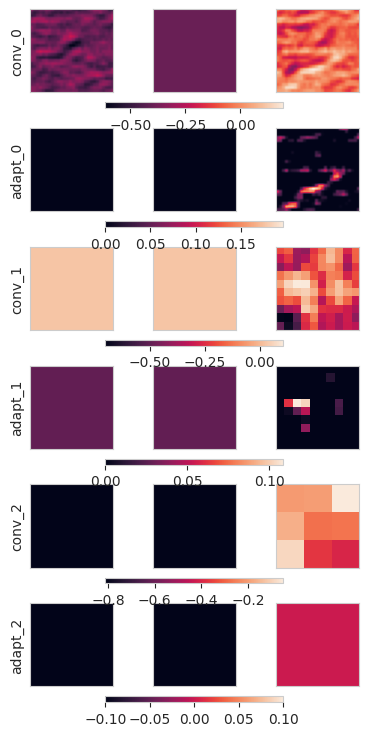

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.3653999865055084     │
│       acc/0.2_True        │    0.3677999973297119     │
│       acc/0.4_False       │    0.4214000105857849     │
│       acc/0.4_True        │    0.4203999936580658     │
│       acc/0.6_False       │    0.48159998655319214    │
│       acc/0.6_True        │    0.4830000102519989     │
│       acc/0.8_False       │    0.5170000195503235     │
│       acc/0.8_True        │    0.5184500217437744     │
│       acc/1.0_False       │    0.5322499871253967     │
│       acc/1.0_True        │    0.5317000150680542     │
│       acc_diff/0.2        │   0.002400000113993883    │
│       acc_diff/0.4        │  -0.0010000000474974513   │
│       acc_diff/0.6        │    0.00139999995008111    │
│       acc_diff/0.8        │   0.001449999981559813    │
│       acc_diff/1.0        │  -0.0005499999970197678   │
│   cum_actv_diff/0.2_l0    │  -4.0682054532226175e-05  │
│   cum_actv_diff/0.2_l1    │  -6.945549830561504e-05   │
│   cum_actv_diff/0.2_l2    │  -0.0001740972074912861   │
│   cum_actv_diff/0.4_l0    │  -1.3786067029286642e-05  │
│   cum_actv_diff/0.4_l1    │  -1.7444586774217896e-05  │
│   cum_actv_diff/0.4_l2    │   2.584437061159406e-05   │
│   cum_actv_diff/0.6_l0    │  -1.6943742593866773e-05  │
│   cum_actv_diff/0.6_l1    │   1.297191465710057e-05   │
│   cum_actv_diff/0.6_l2    │  1.0609879609546624e-05   │
│   cum_actv_diff/0.8_l0    │  2.2351656298269518e-05   │
│   cum_actv_diff/0.8_l1    │   5.230362876318395e-05   │
│   cum_actv_diff/0.8_l2    │   2.412735193502158e-05   │
│   cum_actv_diff/1.0_l0    │   5.143915768712759e-05   │
│   cum_actv_diff/1.0_l1    │   9.611676796339452e-05   │
│   cum_actv_diff/1.0_l2    │   8.234130655182526e-05   │
│         test_acc          │     0.539650022983551     │
│         test_loss         │    1.2746155261993408     │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


divisive


Testing: 0it [00:00, ?it/s]

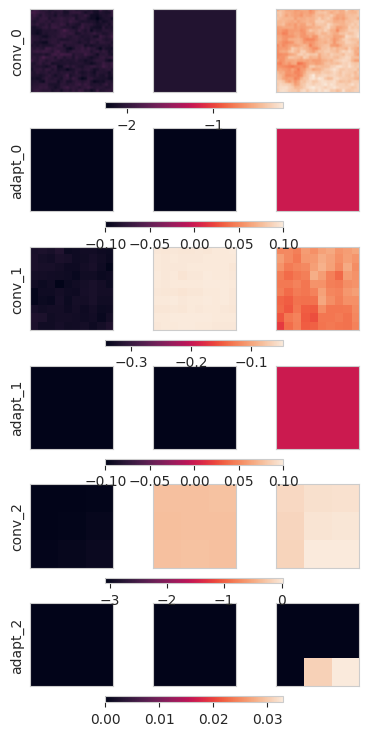

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.3257499933242798     │
│       acc/0.2_True        │    0.3418000042438507     │
│       acc/0.4_False       │    0.29919999837875366    │
│       acc/0.4_True        │    0.40869998931884766    │
│       acc/0.6_False       │    0.2964000105857849     │
│       acc/0.6_True        │     0.510200023651123     │
│       acc/0.8_False       │    0.31424999237060547    │
│       acc/0.8_True        │    0.5634999871253967     │
│       acc/1.0_False       │    0.33785000443458557    │
│       acc/1.0_True        │    0.5767499804496765     │
│       acc_diff/0.2        │   0.016049999743700027    │
│       acc_diff/0.4        │    0.10949999839067459    │
│       acc_diff/0.6        │    0.21379999816417694    │
│       acc_diff/0.8        │    0.24924999475479126    │
│       acc_diff/1.0        │    0.23890000581741333    │
│   cum_actv_diff/0.2_l0    │   0.001513026305474341    │
│   cum_actv_diff/0.2_l1    │  -0.0003655175387393683   │
│   cum_actv_diff/0.2_l2    │   0.002969623077660799    │
│   cum_actv_diff/0.4_l0    │   0.0017010995652526617   │
│   cum_actv_diff/0.4_l1    │  0.00035719465813599527   │
│   cum_actv_diff/0.4_l2    │   0.0032465739641338587   │
│   cum_actv_diff/0.6_l0    │   0.0019819026347249746   │
│   cum_actv_diff/0.6_l1    │   0.0007723551825620234   │
│   cum_actv_diff/0.6_l2    │   0.0033363671973347664   │
│   cum_actv_diff/0.8_l0    │   0.0023498069494962692   │
│   cum_actv_diff/0.8_l1    │   0.001012297230772674    │
│   cum_actv_diff/0.8_l2    │   0.003379408735781908    │
│   cum_actv_diff/1.0_l0    │   0.002646250883117318    │
│   cum_actv_diff/1.0_l1    │   0.0011189042124897242   │
│   cum_actv_diff/1.0_l2    │   0.0034992361906915903   │
│         test_acc          │    0.46893998980522156    │
│         test_loss         │    1.6459643840789795     │
└───────────────────────────┴───────────────────────────┘

<Axes: xlabel='name', ylabel='test_acc'>

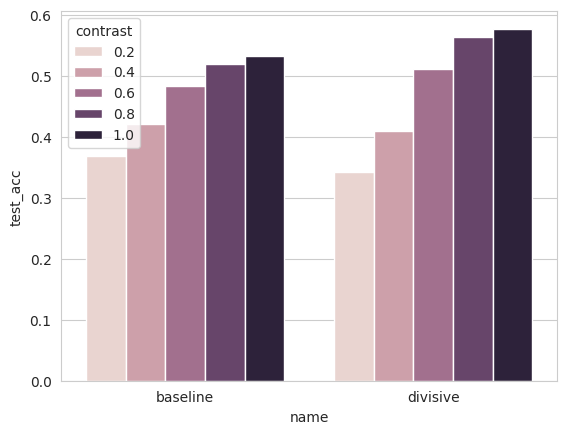

In [12]:
wandb_logger = pl.loggers.WandbLogger(project='ai-thesis', config=config,
                                                      name=f'del')
trainer = pl.Trainer(logger=wandb_logger)
results = {'name': [], 'test_acc': [], 'contrast': []}
for name, model in models.items():
    print(name)
    res = trainer.test(model, test_loader)
    for contrast in [0.2, 0.4, 0.6, 0.8, 1.0]:
        results['name'].append(name)
        results['test_acc'].append(res[0][f'acc/{contrast}_True'])
        results['contrast'].append(contrast)
    
import seaborn as sns

sns.barplot(x='name', y='test_acc', data=results, hue='contrast')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


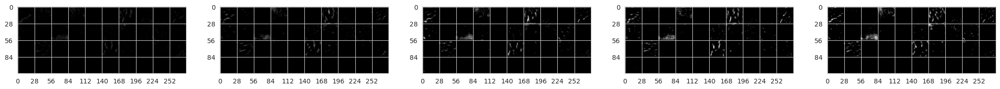

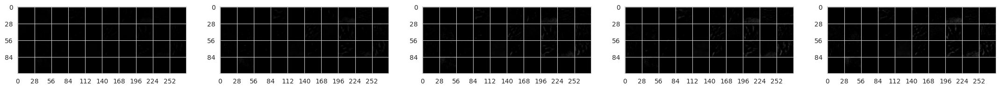

In [14]:
import matplotlib.pyplot as plt
import numpy as np

actvs_grid(models['baseline'], test_dataset, 0, 0)
plt.show()
#actvs_grid(models['additive'], test_dataset, 0, 0)
#plt.show()
actvs_grid(models['divisive'], test_dataset, 0, 0)

# Cifar-10

In [54]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


df = pd.read_csv('experimental_data/num_maps_cifar10_30ep/version_0/metrics.csv', delimiter=',')

In [55]:
df[['contrast', 'epoch', 'repeat_noise']] = df[['contrast', 'epoch', 'repeat_noise']].ffill()
df = df.dropna()

In [5]:
# load model
with open('config.json', 'r') as f:
    config = json.load(f)
hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_cifar10'], ExponentialDecay, 
                                [
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False}
  ]
                                )
model = Adaptation.load_from_checkpoint(
    'learned_models/baseline_generalization_cifar_ExponentialDecay_contrast_[0.2, 1.0]_repeat_noise_True_epoch_20.ckpt', model=hooked_cnn)

models = {}
models['baseline'] = model

additive_hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_cifar10'], ExponentialDecay,
                                config['adaptation_kwargs_additive'])
additive_model = Adaptation.load_from_checkpoint(
    'learned_models/generalization_cifar_ExponentialDecay_contrast_[0.2, 1.0]_repeat_noise_True_epoch_20.ckpt',
    model=additive_hooked_cnn)
models['additive'] = additive_model

divisive_hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_cifar10'], DivisiveNorm,
                                config['adaptation_kwargs_div_norm'])
divisive_model = Adaptation.load_from_checkpoint(
    'learned_models/generalization_cifar_DivisiveNorm_contrast_[0.2, 1.0]_repeat_noise_True_epoch_20.ckpt',
    model=divisive_hooked_cnn)
models['divisive'] = divisive_model


In [22]:
train_loader, test_loader, train_dataset, test_dataset = get_dataloaders('cifar10', with_ground_truth=True)

Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Foun

In [23]:
x, y = next(iter(train_loader))
print(x.shape, y.shape)
int_to_label = {
    0: 'airplane',
    1: 'automobile',
    2: 'bird',
    3: 'cat',
    4: 'deer',
    5: 'dog',
    6: 'frog',
    7: 'horse',
    8: 'ship',
    9: 'truck'
}

torch.Size([64, 4, 3, 32, 32]) torch.Size([64])


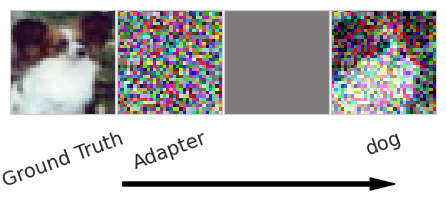

In [40]:
import matplotlib.pyplot as plt
from matplotlib.patches import FancyArrow

idx = 4
sample = x[idx].permute((0, 2, 3, 1))
fig, axes = plt.subplots(1, 4, figsize=(5.5, 4))  # Adjusted figsize to make it wider
fig.subplots_adjust(wspace=0.02)

for i, ax in enumerate(axes):
    ax.imshow(sample[i], cmap='gray', vmin=0.4, vmax=1)  # Set colormap to greyscale
    if i == 0:
        ax.set_xlabel('Ground Truth', labelpad=10, fontsize=14, rotation=20)  # Rotate and position labels
    if i == 1:
        ax.set_xlabel('Adapter', labelpad=10, fontsize=14, rotation=20)  # Rotate and position labels
    if i == 3:
        ax.set_xlabel(int_to_label[int(y[idx])], labelpad=10, fontsize=14, rotation=20)  # Rotate and position labels
    ax.set_xticks([])  # Remove x ticks
    ax.set_yticks([])  # Remove y ticks

# Drawing a long arrow
arrow = FancyArrow(0.33, 0.19, 0.45, 0, width=0.01, color='black', transform=fig.transFigure, clip_on=False)
fig.add_artist(arrow)

plt.savefig('figures/noise_001.pdf', bbox_inches='tight')
plt.savefig('figures/noise_001.png', bbox_inches='tight')
plt.savefig('figures/noise_001.svg', bbox_inches='tight')

In [39]:
models['additive'].model.adapt_layers[0].alpha, models['additive'].model.adapt_layers[0].beta

(Parameter containing:
 tensor(0.4325, requires_grad=True),
 Parameter containing:
 tensor(4.1362, requires_grad=True))

In [6]:
train_loader, test_loader, train_dataset, test_dataset = get_dataloaders('cifar10')

Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Foun

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/pytorch_lightning/loggers/wandb.py:395: UserWarning:

There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


baseline


Testing: 0it [00:00, ?it/s]

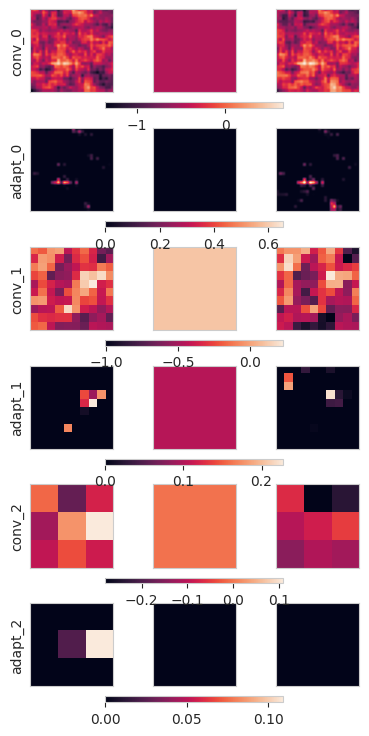

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.2741999924182892     │
│       acc/0.2_True        │    0.2808000147342682     │
│       acc/0.4_False       │    0.38119998574256897    │
│       acc/0.4_True        │    0.3781000077724457     │
│       acc/0.6_False       │    0.43860000371932983    │
│       acc/0.6_True        │    0.43790000677108765    │
│       acc/0.8_False       │    0.4772000014781952     │
│       acc/0.8_True        │    0.46889999508857727    │
│       acc/1.0_False       │    0.4878999888896942     │
│       acc/1.0_True        │    0.49300000071525574    │
│       acc_diff/0.2        │   0.006599999964237213    │
│       acc_diff/0.4        │   -0.003100000089034438   │
│       acc_diff/0.6        │   -0.000699999975040555   │
│       acc_diff/0.8        │   -0.008299999870359898   │
│       acc_diff/1.0        │   0.005100000184029341    │
│   cum_actv_diff/0.2_l0    │    -8.148088818416e-05    │
│   cum_actv_diff/0.2_l1    │  -3.5893404856324196e-05  │
│   cum_actv_diff/0.2_l2    │  -0.00011591636575758457  │
│   cum_actv_diff/0.4_l0    │  1.6165232636922156e-06   │
│   cum_actv_diff/0.4_l1    │  1.4681481843581423e-05   │
│   cum_actv_diff/0.4_l2    │  -1.2167615750513505e-05  │
│   cum_actv_diff/0.6_l0    │  -1.1327563697705045e-05  │
│   cum_actv_diff/0.6_l1    │  -1.1880473721248563e-05  │
│   cum_actv_diff/0.6_l2    │  -3.9801896491553634e-05  │
│   cum_actv_diff/0.8_l0    │   7.367775833699852e-05   │
│   cum_actv_diff/0.8_l1    │  -1.2829045772377867e-06  │
│   cum_actv_diff/0.8_l2    │  1.6754431271692738e-05   │
│   cum_actv_diff/1.0_l0    │   7.000239565968513e-05   │
│   cum_actv_diff/1.0_l1    │   7.333354733418673e-05   │
│   cum_actv_diff/1.0_l2    │   7.718754932284355e-05   │
│         test_acc          │    0.4117799997329712     │
│         test_loss         │    1.6332131624221802     │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


additive


Testing: 0it [00:00, ?it/s]

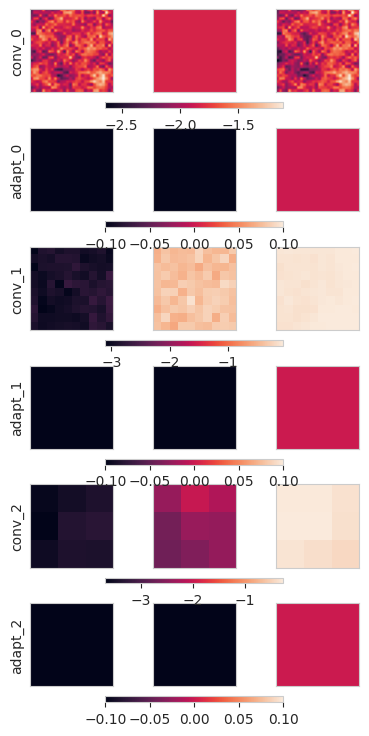

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.10329999774694443    │
│       acc/0.2_True        │    0.6182000041007996     │
│       acc/0.4_False       │    0.11289999634027481    │
│       acc/0.4_True        │    0.6157000064849854     │
│       acc/0.6_False       │    0.12729999423027039    │
│       acc/0.6_True        │    0.6202999949455261     │
│       acc/0.8_False       │    0.14810000360012054    │
│       acc/0.8_True        │    0.6358000040054321     │
│       acc/1.0_False       │    0.16979999840259552    │
│       acc/1.0_True        │    0.6425999999046326     │
│       acc_diff/0.2        │    0.5149000287055969     │
│       acc_diff/0.4        │    0.5027999877929688     │
│       acc_diff/0.6        │    0.49300000071525574    │
│       acc_diff/0.8        │    0.4876999855041504     │
│       acc_diff/1.0        │    0.47279998660087585    │
│   cum_actv_diff/0.2_l0    │   0.059659820050001144    │
│   cum_actv_diff/0.2_l1    │    0.02139783650636673    │
│   cum_actv_diff/0.2_l2    │   -0.00271377875469625    │
│   cum_actv_diff/0.4_l0    │    0.05546838417649269    │
│   cum_actv_diff/0.4_l1    │   0.019437553361058235    │
│   cum_actv_diff/0.4_l2    │  -0.0023166604805737734   │
│   cum_actv_diff/0.6_l0    │    0.05061373859643936    │
│   cum_actv_diff/0.6_l1    │   0.016054494306445122    │
│   cum_actv_diff/0.6_l2    │   -0.002225758507847786   │
│   cum_actv_diff/0.8_l0    │    0.04603051021695137    │
│   cum_actv_diff/0.8_l1    │   0.012622841633856297    │
│   cum_actv_diff/0.8_l2    │  -0.0017102262936532497   │
│   cum_actv_diff/1.0_l0    │   0.041659172624349594    │
│   cum_actv_diff/1.0_l1    │    0.00928163155913353    │
│   cum_actv_diff/1.0_l2    │  -0.0006634684395976365   │
│         test_acc          │    0.37940001487731934    │
│         test_loss         │    2.6557157039642334     │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


divisive


Testing: 0it [00:00, ?it/s]

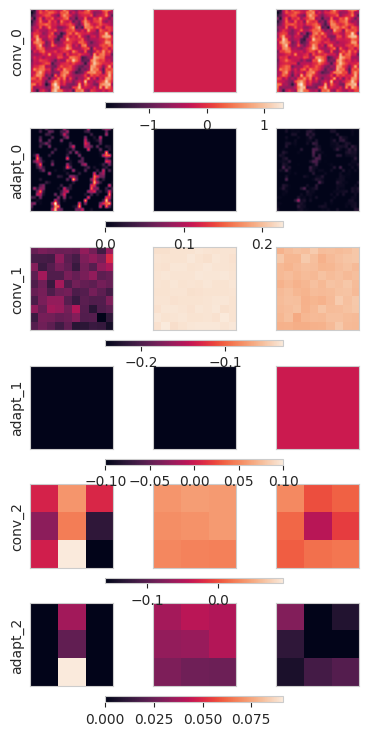

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.22290000319480896    │
│       acc/0.2_True        │    0.4343999922275543     │
│       acc/0.4_False       │    0.2930999994277954     │
│       acc/0.4_True        │    0.4681999981403351     │
│       acc/0.6_False       │    0.35100001096725464    │
│       acc/0.6_True        │    0.5015000104904175     │
│       acc/0.8_False       │    0.38499999046325684    │
│       acc/0.8_True        │    0.5189999938011169     │
│       acc/1.0_False       │    0.4153999984264374     │
│       acc/1.0_True        │    0.5284000039100647     │
│       acc_diff/0.2        │    0.21150000393390656    │
│       acc_diff/0.4        │    0.17509999871253967    │
│       acc_diff/0.6        │    0.15049999952316284    │
│       acc_diff/0.8        │    0.1340000033378601     │
│       acc_diff/1.0        │    0.11299999803304672    │
│   cum_actv_diff/0.2_l0    │   0.004145794548094273    │
│   cum_actv_diff/0.2_l1    │   0.006861444562673569    │
│   cum_actv_diff/0.2_l2    │   0.0014979956904426217   │
│   cum_actv_diff/0.4_l0    │   0.004108726512640715    │
│   cum_actv_diff/0.4_l1    │    0.00637856824323535    │
│   cum_actv_diff/0.4_l2    │   0.0030390252359211445   │
│   cum_actv_diff/0.6_l0    │   0.0039622108452022076   │
│   cum_actv_diff/0.6_l1    │   0.005828865338116884    │
│   cum_actv_diff/0.6_l2    │   0.003292270703241229    │
│   cum_actv_diff/0.8_l0    │   0.003821750869974494    │
│   cum_actv_diff/0.8_l1    │   0.005409697536379099    │
│   cum_actv_diff/0.8_l2    │   0.0033328933641314507   │
│   cum_actv_diff/1.0_l0    │   0.003630678867921233    │
│   cum_actv_diff/1.0_l1    │   0.004984721541404724    │
│   cum_actv_diff/1.0_l2    │   0.003289457643404603    │
│         test_acc          │    0.4118900001049042     │
│         test_loss         │    1.6943053007125854     │
└───────────────────────────┴───────────────────────────┘

<Axes: xlabel='name', ylabel='test_acc'>

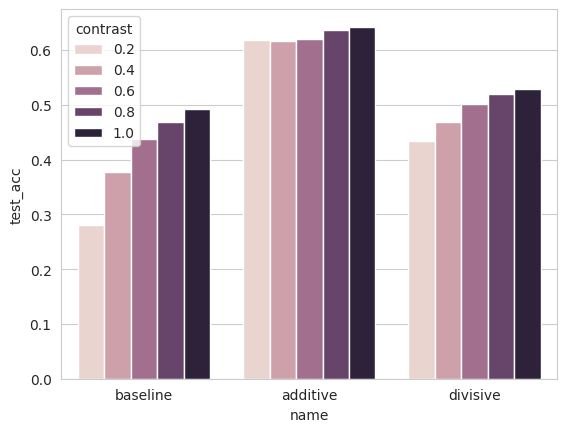

In [41]:
wandb_logger = pl.loggers.WandbLogger(project='ai-thesis', config=config,
                                                      name=f'del')
trainer = pl.Trainer(logger=wandb_logger)
results = {'name': [], 'test_acc': [], 'contrast': [], 'repeat_noise': []}
for name, model in models.items():
    print(name)
    res = trainer.test(model, test_loader)
    for contrast in [0.2, 0.4, 0.6, 0.8, 1.0]:
        results['name'].append(name)
        results['test_acc'].append(res[0][f'acc/{contrast}_True'])
        results['contrast'].append(contrast)
        results['repeat_noise'].append(True)
    
import seaborn as sns

sns.barplot(x='name', y='test_acc', data=results, hue='contrast')

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


baseline


Testing: 0it [00:00, ?it/s]

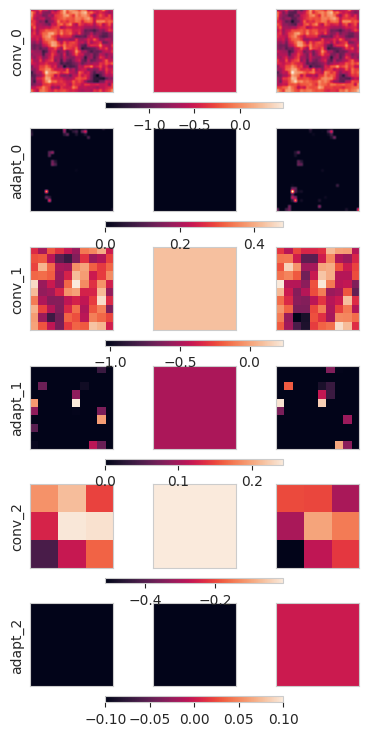

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.2761499881744385     │
│       acc/0.2_True        │    0.2800000011920929     │
│       acc/0.4_False       │    0.3811500072479248     │
│       acc/0.4_True        │    0.3779500126838684     │
│       acc/0.6_False       │     0.436599999666214     │
│       acc/0.6_True        │    0.4380500018596649     │
│       acc/0.8_False       │    0.47644999623298645    │
│       acc/0.8_True        │    0.4706000089645386     │
│       acc/1.0_False       │    0.48934999108314514    │
│       acc/1.0_True        │    0.4936000108718872     │
│       acc_diff/0.2        │   0.0038499999791383743   │
│       acc_diff/0.4        │  -0.0031999999191612005   │
│       acc_diff/0.6        │   0.001449999981559813    │
│       acc_diff/0.8        │   -0.005849999841302633   │
│       acc_diff/1.0        │   0.0042500002309679985   │
│   cum_actv_diff/0.2_l0    │  -7.482758519472554e-05   │
│   cum_actv_diff/0.2_l1    │  -4.613320925273001e-05   │
│   cum_actv_diff/0.2_l2    │  -0.00011661384633043781  │
│   cum_actv_diff/0.4_l0    │  2.5428009848837974e-06   │
│   cum_actv_diff/0.4_l1    │  1.1791059478127863e-05   │
│   cum_actv_diff/0.4_l2    │   -2.48643755185185e-06   │
│   cum_actv_diff/0.6_l0    │  -1.804059684218373e-05   │
│   cum_actv_diff/0.6_l1    │  -9.252463314624038e-06   │
│   cum_actv_diff/0.6_l2    │  -4.977464413968846e-05   │
│   cum_actv_diff/0.8_l0    │   6.35739925201051e-05    │
│   cum_actv_diff/0.8_l1    │  1.4562910109816585e-05   │
│   cum_actv_diff/0.8_l2    │   2.766127909126226e-05   │
│   cum_actv_diff/1.0_l0    │   7.834881398594007e-05   │
│   cum_actv_diff/1.0_l1    │   6.715033669024706e-05   │
│   cum_actv_diff/1.0_l2    │   0.0001036690518958494   │
│         test_acc          │     0.412200003862381     │
│         test_loss         │    1.6343251466751099     │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


additive


Testing: 0it [00:00, ?it/s]

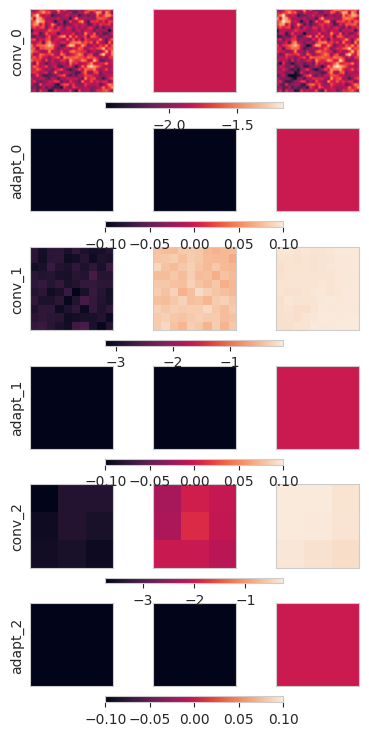

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.10440000146627426    │
│       acc/0.2_True        │    0.6215999722480774     │
│       acc/0.4_False       │    0.11400000005960464    │
│       acc/0.4_True        │    0.6148499846458435     │
│       acc/0.6_False       │    0.12764999270439148    │
│       acc/0.6_True        │    0.6189500093460083     │
│       acc/0.8_False       │    0.15015000104904175    │
│       acc/0.8_True        │    0.6363499760627747     │
│       acc/1.0_False       │    0.17194999754428864    │
│       acc/1.0_True        │    0.6446499824523926     │
│       acc_diff/0.2        │    0.5171999931335449     │
│       acc_diff/0.4        │    0.5008500218391418     │
│       acc_diff/0.6        │    0.49129998683929443    │
│       acc_diff/0.8        │    0.4862000048160553     │
│       acc_diff/1.0        │    0.47269999980926514    │
│   cum_actv_diff/0.2_l0    │   0.059656642377376556    │
│   cum_actv_diff/0.2_l1    │    0.0213959701359272     │
│   cum_actv_diff/0.2_l2    │  -0.0026564644649624825   │
│   cum_actv_diff/0.4_l0    │   0.055467989295721054    │
│   cum_actv_diff/0.4_l1    │   0.019413750618696213    │
│   cum_actv_diff/0.4_l2    │  -0.0022900791373103857   │
│   cum_actv_diff/0.6_l0    │    0.0505932979285717     │
│   cum_actv_diff/0.6_l1    │   0.016047324985265732    │
│   cum_actv_diff/0.6_l2    │  -0.0021960751619189978   │
│   cum_actv_diff/0.8_l0    │    0.04603365436196327    │
│   cum_actv_diff/0.8_l1    │   0.012627005577087402    │
│   cum_actv_diff/0.8_l2    │  -0.0016894303262233734   │
│   cum_actv_diff/1.0_l0    │    0.04167018458247185    │
│   cum_actv_diff/1.0_l1    │   0.009318478405475616    │
│   cum_actv_diff/1.0_l2    │  -0.0006783573771826923   │
│         test_acc          │    0.3815099895000458     │
│         test_loss         │    2.6544716358184814     │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


divisive


Testing: 0it [00:00, ?it/s]

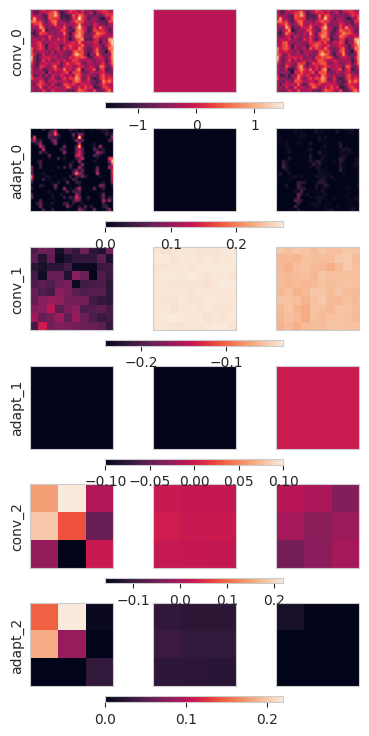

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.21940000355243683    │
│       acc/0.2_True        │    0.4312500059604645     │
│       acc/0.4_False       │    0.29280000925064087    │
│       acc/0.4_True        │    0.46775001287460327    │
│       acc/0.6_False       │    0.3451499938964844     │
│       acc/0.6_True        │    0.5006999969482422     │
│       acc/0.8_False       │    0.3860499858856201     │
│       acc/0.8_True        │    0.5227500200271606     │
│       acc/1.0_False       │    0.4171000123023987     │
│       acc/1.0_True        │    0.5302000045776367     │
│       acc_diff/0.2        │    0.21185000240802765    │
│       acc_diff/0.4        │    0.1749500036239624     │
│       acc_diff/0.6        │    0.1555500030517578     │
│       acc_diff/0.8        │    0.13670000433921814    │
│       acc_diff/1.0        │    0.11309999972581863    │
│   cum_actv_diff/0.2_l0    │   0.004144678823649883    │
│   cum_actv_diff/0.2_l1    │   0.006860838271677494    │
│   cum_actv_diff/0.2_l2    │   0.0014704987406730652   │
│   cum_actv_diff/0.4_l0    │   0.004105817526578903    │
│   cum_actv_diff/0.4_l1    │   0.006364905275404453    │
│   cum_actv_diff/0.4_l2    │   0.003026663325726986    │
│   cum_actv_diff/0.6_l0    │   0.0039632380940020084   │
│   cum_actv_diff/0.6_l1    │   0.005834249313920736    │
│   cum_actv_diff/0.6_l2    │   0.003290677908807993    │
│   cum_actv_diff/0.8_l0    │   0.003820466110482812    │
│   cum_actv_diff/0.8_l1    │   0.0054101767018437386   │
│   cum_actv_diff/0.8_l2    │   0.0033162508625537157   │
│   cum_actv_diff/1.0_l0    │   0.0036293454468250275   │
│   cum_actv_diff/1.0_l1    │    0.00497886398807168    │
│   cum_actv_diff/1.0_l2    │   0.003299322444945574    │
│         test_acc          │    0.4107399880886078     │
│         test_loss         │    1.6944193840026855     │
└───────────────────────────┴───────────────────────────┘

<Axes: xlabel='name', ylabel='test_acc'>

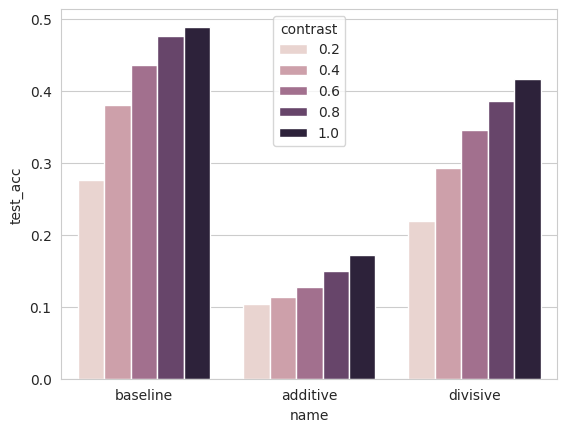

In [42]:
for name, model in models.items():
    print(name)
    res = trainer.test(model, test_loader)
    for contrast in [0.2, 0.4, 0.6, 0.8, 1.0]:
        results['name'].append(name)
        results['test_acc'].append(res[0][f'acc/{contrast}_False'])
        results['contrast'].append(contrast)
        results['repeat_noise'].append(False)
    
import seaborn as sns

results = pd.DataFrame(results)
sns.barplot(x='name', y='test_acc', data=results[results.repeat_noise==False], hue='contrast')

In [43]:
import pandas as pd


results = pd.DataFrame(results)
# make names more beautiful
results = results.rename(columns={'name': 'Model', 'test_acc': 'Accuracy', 'contrast': 'Contrast', 'repeat_noise': 'Repeat Noise'})
results

,Model,Accuracy,Contrast,Repeat Noise
0,baseline,0.28080,0.2,True
1,baseline,0.37810,0.4,True
2,baseline,0.43790,0.6,True
3,baseline,0.46890,0.8,True
4,baseline,0.49300,1.0,True
5,additive,0.61820,0.2,True
6,additive,0.61570,0.4,True
7,additive,0.62030,0.6,True
8,additive,0.63580,0.8,True
9,additive,0.64260,1.0,True


/tmp/ipykernel_1173019/1583370945.py:4: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:grey'` for the same effect.


/tmp/ipykernel_1173019/1583370945.py:5: FutureWarning:



Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:red'` for the same effect.




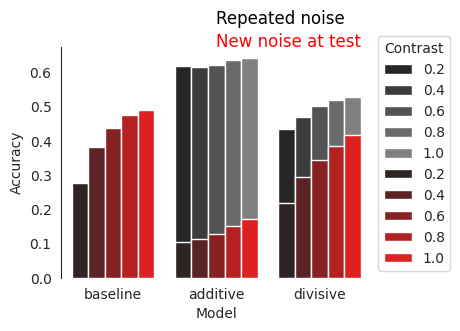

In [56]:
import matplotlib.pyplot as plt
sns.set_style('white')
plt.figure(figsize=(4, 3))
sns.barplot(data=results[results['Repeat Noise']==True], x='Model', hue='Contrast', y='Accuracy', color='grey')
sns.barplot(data=results[results['Repeat Noise']==False], x='Model', hue='Contrast', y='Accuracy', color='red')

# legend position lower right
plt.legend(bbox_to_anchor=(1.0, 0.0), loc='lower left', ncol=1, title='Contrast')
sns.despine(bottom=True)

# add red text
plt.text(0.5, 1.0, 'New noise at test', color='red', transform=plt.gca().transAxes, fontsize=12)
# add black text
plt.text(0.5, 1.1, 'Repeated noise', color='black', transform=plt.gca().transAxes, fontsize=12)

plt.savefig('figures/noise_008.pdf', bbox_inches='tight')
plt.savefig('figures/noise_008.png', bbox_inches='tight')
plt.savefig('figures/noise_008.svg', bbox_inches='tight')

/tmp/ipykernel_1146684/2658397291.py:4: UserWarning:

The palette list has more values (10) than needed (2), which may not be intended.



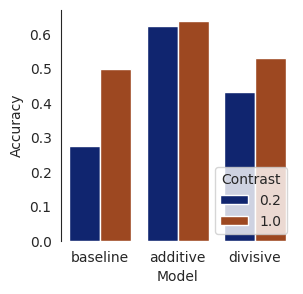

In [76]:
sns.set_style('white')
palette = sns.color_palette("dark")
fig = plt.figure(figsize=(3, 3))
sns.barplot(data=results[(results.Contrast.isin([0.2, 1.0])) & (results['Repeat Noise'] == True)], x='Model', hue='Contrast', y='Accuracy', palette=palette, legend=True)
# legend position lower right
#plt.legend(bbox_to_anchor=(1.05, 0.0), loc='lower left', ncol=1)
plt.legend(loc='lower right', title='Contrast')
sns.despine(bottom=True)

plt.savefig('figures/noise_003.pdf', bbox_inches='tight')
plt.savefig('figures/noise_003.png', bbox_inches='tight')
plt.savefig('figures/noise_003.svg', bbox_inches='tight')

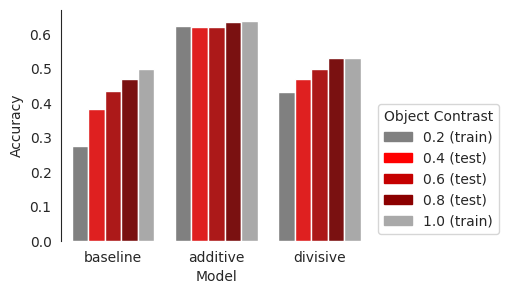

In [90]:
import matplotlib.patches as mpatches

fig = plt.figure(figsize=(4, 3))

palette = ['grey', 'red', '#c50000', 'darkred', 'darkgrey']
labels = ['0.2 (train)', '0.4 (test)', '0.6 (test)', '0.8 (test)', '1.0 (train)']
sns.barplot(data=results[(results['Repeat Noise'] == True)], x='Model', hue='Contrast', y='Accuracy', palette=palette, legend=True)
#plt.legend( title='Object Contrast', labels=['0.2 (train)', '0.4 (test)', '0.6 (test)', '0.8 (test)', '1.0 (train)'], bbox_to_anchor=(1., 0.0), loc='lower left', ncol=1)

handles = [mpatches.Patch(color=color, label=label) for color, label in zip(palette, labels)]
plt.legend(handles=handles, title='Object Contrast', bbox_to_anchor=(1., 0.0), loc='lower left', ncol=1)

# move legend out

sns.despine(bottom=True)

plt.savefig('figures/noise_004.pdf', bbox_inches='tight')
plt.savefig('figures/noise_004.png', bbox_inches='tight')
plt.savefig('figures/noise_004.svg', bbox_inches='tight')

In [95]:
train_loader, test_loader, train_dataset, test_dataset = get_dataloaders('cifar10', noise_type='normal')

Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Foun

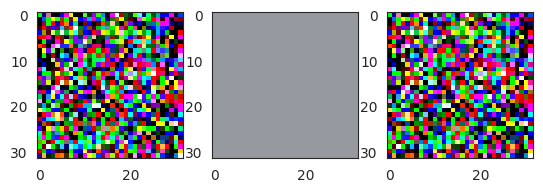

In [108]:
# show sample
x, y, contrast, rep_noise = next(iter(test_loader))
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 3,)
for i in range(3):
    axs[i].imshow(x[1, i].permute(1, 2, 0))
plt.show()

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/pytorch_lightning/loggers/wandb.py:395: UserWarning:

There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/

Testing: 0it [00:00, ?it/s]

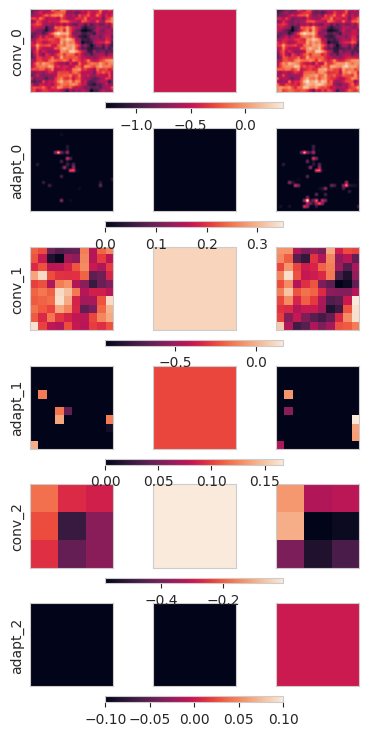

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

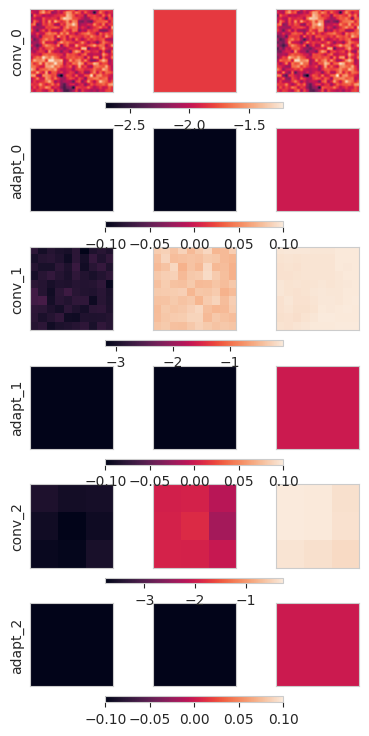

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

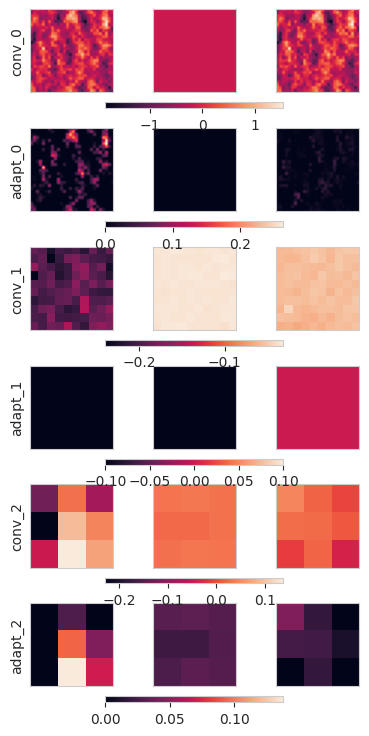

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



,name,test_acc,contrast,repeat_noise
0,baseline,0.2772,0.2,True
1,baseline,0.3790,0.4,True
2,baseline,0.4378,0.6,True
3,baseline,0.4705,0.8,True
4,baseline,0.4944,1.0,True
5,additive,0.6262,0.2,True
6,additive,0.6171,0.4,True
7,additive,0.6188,0.6,True
8,additive,0.6369,0.8,True
9,additive,0.6442,1.0,True


In [20]:
wandb_logger = pl.loggers.WandbLogger(project='ai-thesis', config=config,
                                                      name=f'del')
trainer = pl.Trainer(logger=wandb_logger)
results = {'name': [], 'test_acc': [], 'contrast': [], 'repeat_noise': []}
train_loader, test_loader, train_dataset, test_dataset = get_dataloaders('cifar10')
for name, model in models.items():
    res = trainer.test(model, test_loader, verbose=False)
    for contrast in [0.2, 0.4, 0.6, 0.8, 1.0]:
        results['name'].append(name)
        results['test_acc'].append(res[0][f'acc/{contrast}_True'])
        results['contrast'].append(contrast)
        results['repeat_noise'].append(True)
orig_acc = pd.DataFrame(results)
orig_acc

In [21]:
import pandas as pd

orig_acc = pd.DataFrame(results)
orig_acc

,name,test_acc,contrast,repeat_noise
0,baseline,0.2772,0.2,True
1,baseline,0.3790,0.4,True
2,baseline,0.4378,0.6,True
3,baseline,0.4705,0.8,True
4,baseline,0.4944,1.0,True
5,additive,0.6262,0.2,True
6,additive,0.6171,0.4,True
7,additive,0.6188,0.6,True
8,additive,0.6369,0.8,True
9,additive,0.6442,1.0,True


<Axes: xlabel='name', ylabel='test_acc'>

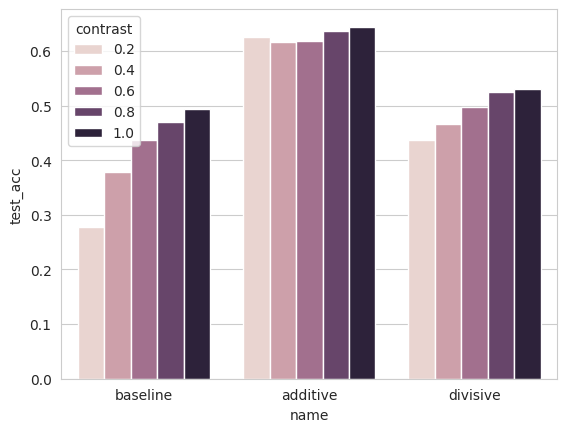

In [22]:
import seaborn as sns

sns.barplot(x='name', y='test_acc', data=results, hue='contrast')

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/pytorch_lightning/loggers/wandb.py:395: UserWarning:

There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/

Testing: 0it [00:00, ?it/s]

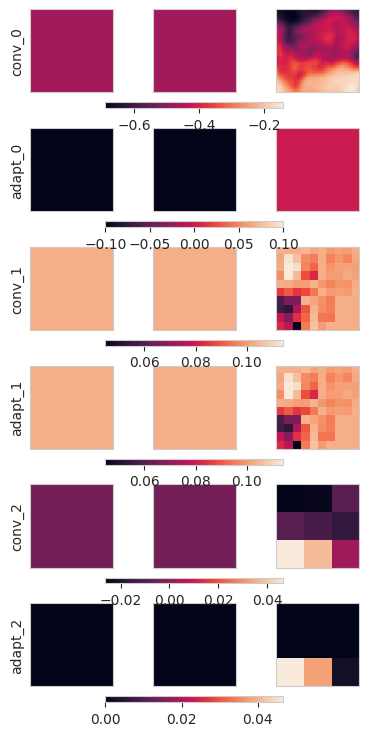

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

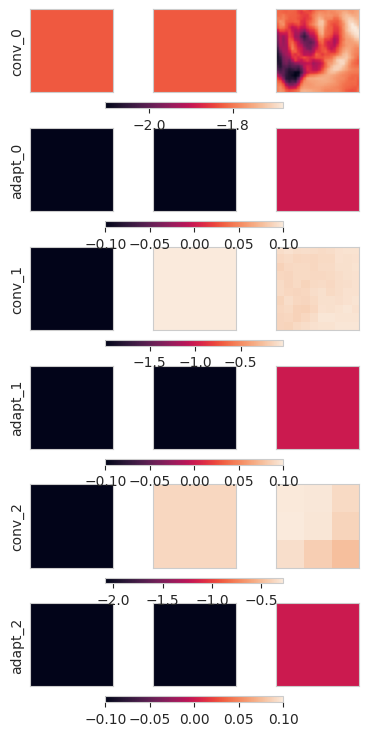

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

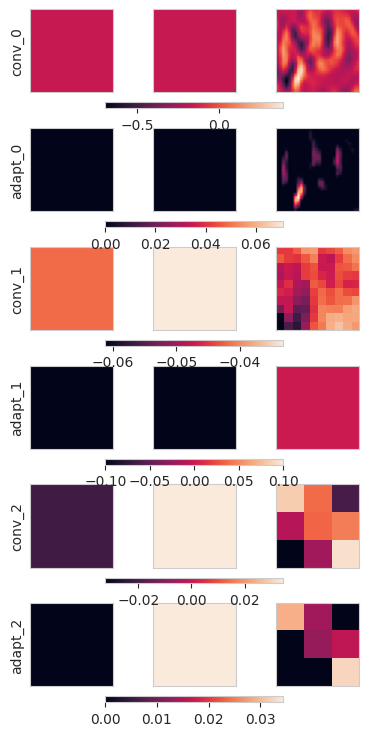

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached datas

Testing: 0it [00:00, ?it/s]

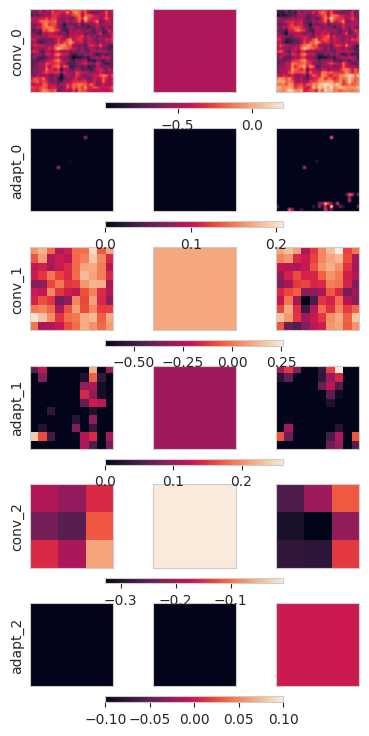

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

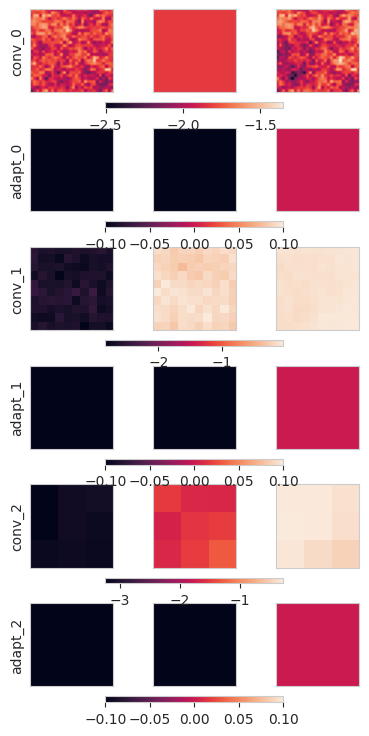

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

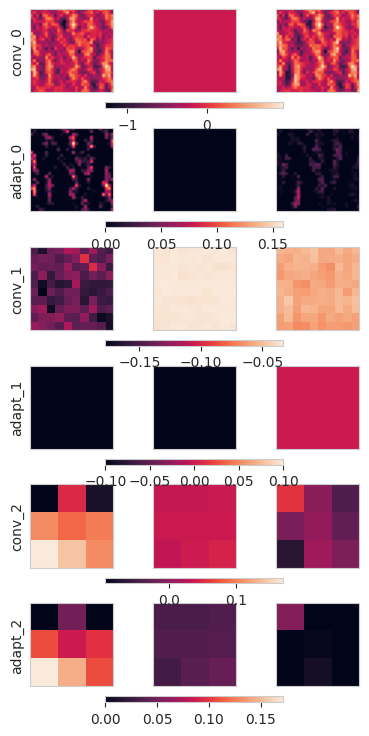

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached datas

Testing: 0it [00:00, ?it/s]

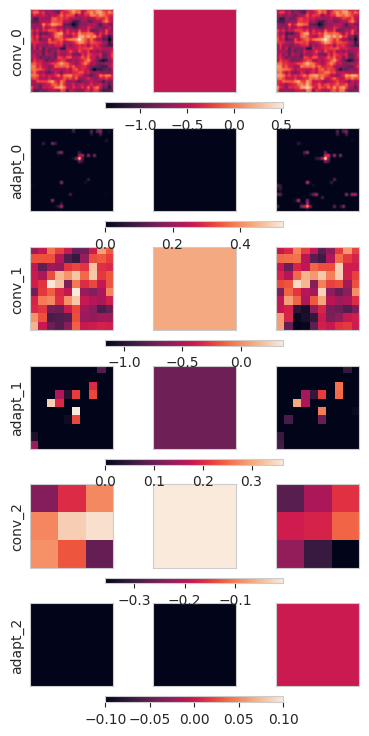

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

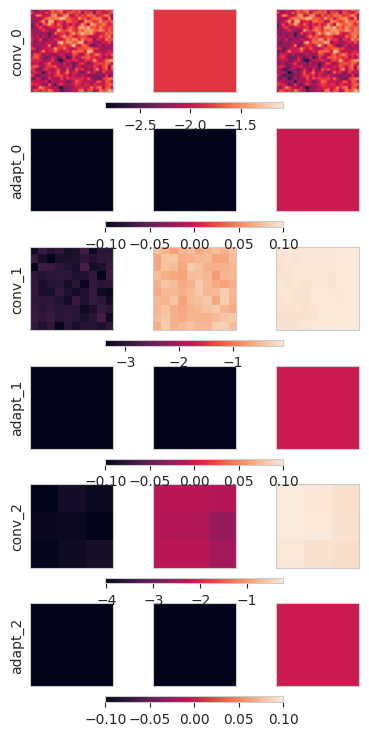

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

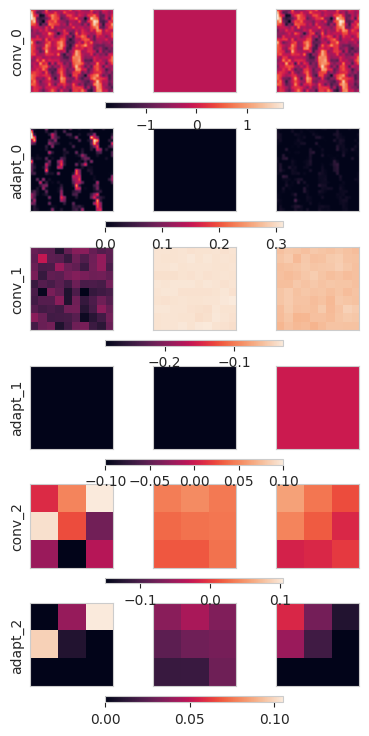

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached datas

Testing: 0it [00:00, ?it/s]

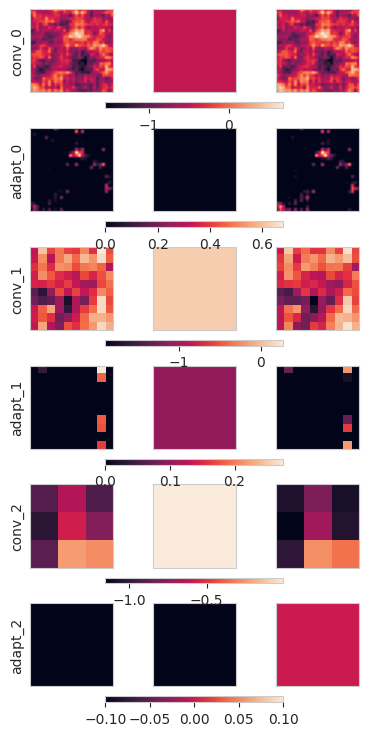

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

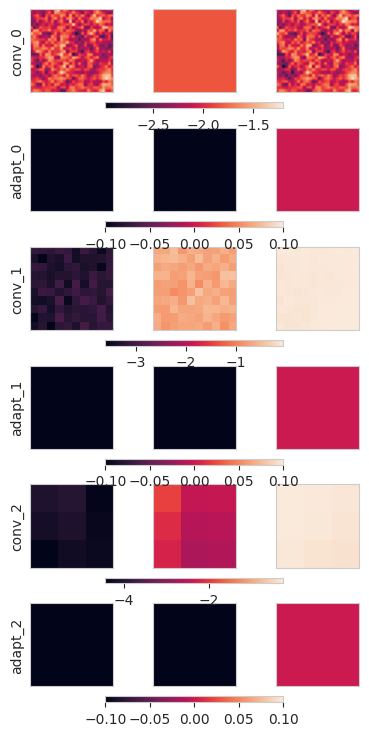

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

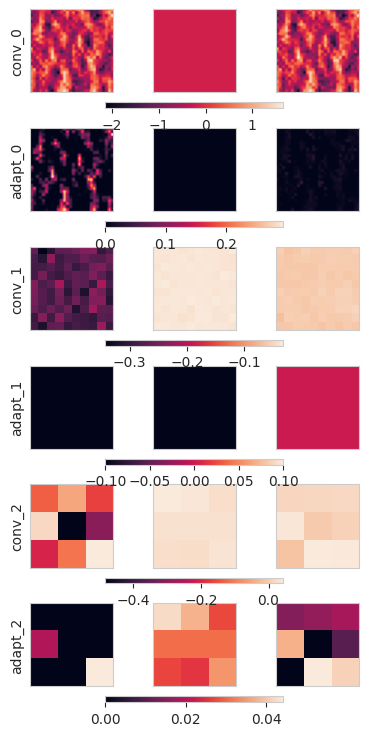

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached datas

Testing: 0it [00:00, ?it/s]

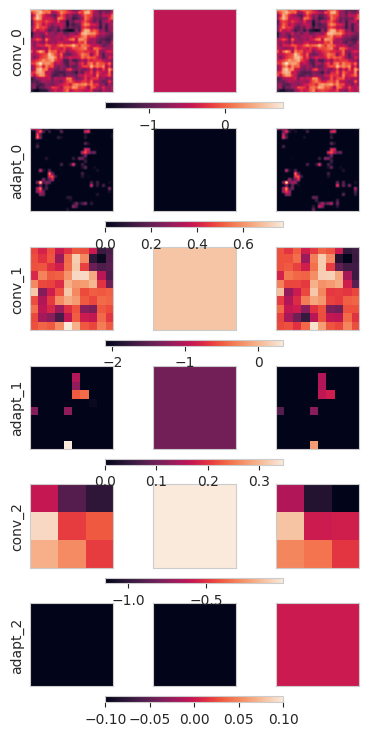

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

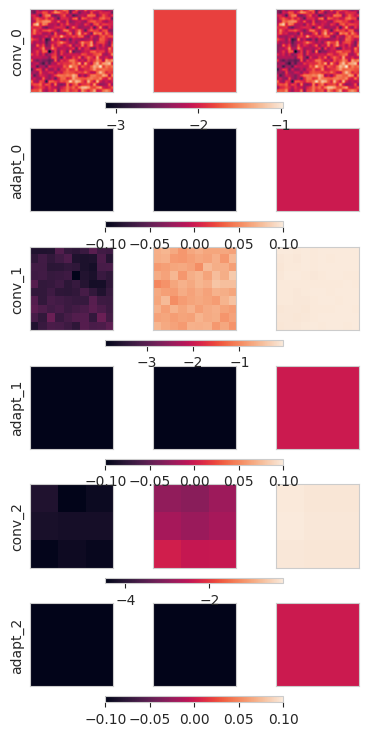

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

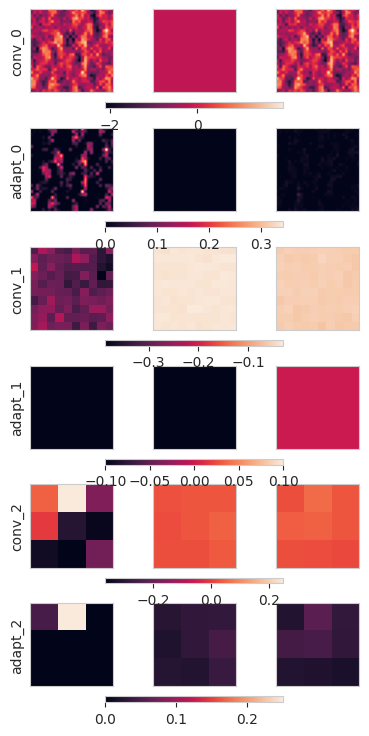

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached datas

Testing: 0it [00:00, ?it/s]

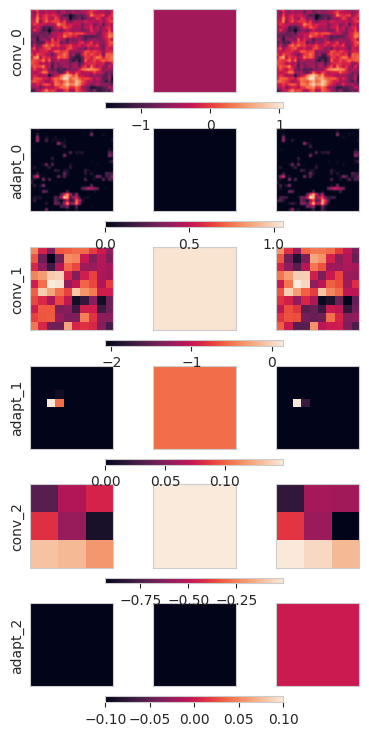

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

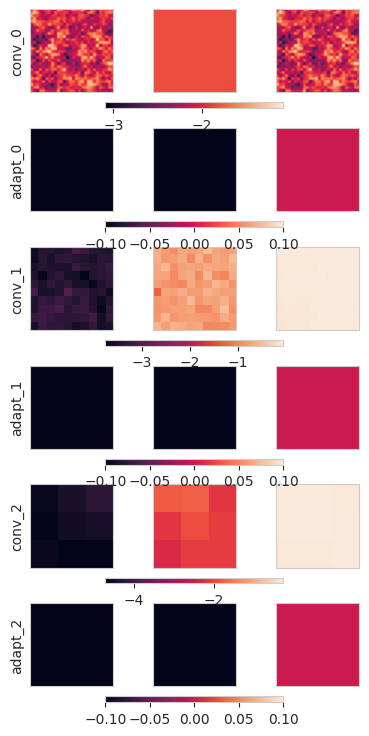

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

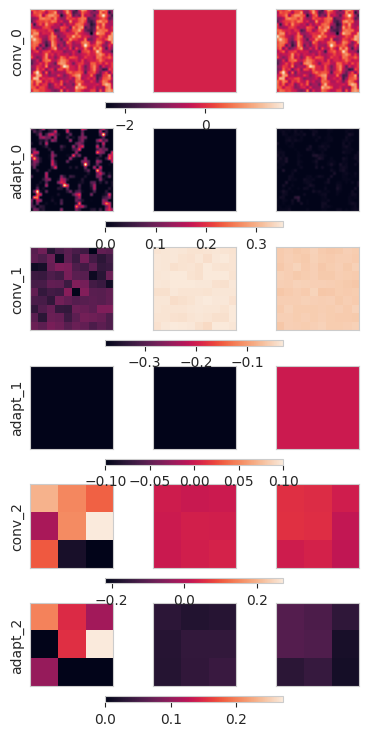

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



,name,test_acc,contrast,repeat_noise,noise_std
0,baseline,0.205250,0.2,True,0.0
1,baseline,0.335400,0.4,True,0.0
2,baseline,0.424450,0.6,True,0.0
3,baseline,0.473650,0.8,True,0.0
4,baseline,0.502000,1.0,True,0.0
...,...,...,...,...,...
85,divisive,0.355729,0.2,True,1.0
86,divisive,0.427371,0.4,True,1.0
87,divisive,0.460843,0.6,True,1.0
88,divisive,0.482757,0.8,True,1.0


In [23]:
wandb_logger = pl.loggers.WandbLogger(project='ai-thesis', config=config,
                                                      name=f'del')
trainer = pl.Trainer(logger=wandb_logger)
results = {'name': [], 'test_acc': [], 'contrast': [], 'repeat_noise': [], 'noise_std': []}
for noise_std in [0, 0.2, 0.4, 0.6, 0.8, 1.0]:
    train_loader, test_loader, train_dataset, test_dataset = get_dataloaders('cifar10', noise_type='normal', noise_std=noise_std)
    for name, model in models.items():
        res = trainer.test(model, test_loader, verbose=False)
        for contrast in [0.2, 0.4, 0.6, 0.8, 1.0]:
            results['name'].append(name)
            results['test_acc'].append(res[0][f'acc/{contrast}_True'])
            results['contrast'].append(contrast)
            results['repeat_noise'].append(True)
            results['noise_std'].append(noise_std)
normal_acc = pd.DataFrame(results)
normal_acc

In [63]:
normal_acc = normal_acc.rename(columns={'name': 'Model', 'test_acc': 'Accuracy', 'contrast': 'Contrast', 'repeat_noise': 'Repeat Noise', 'noise_std': 'Noise $\sigma$'})

/tmp/ipykernel_1173019/2315827479.py:3: UserWarning:

The palette list has more values (10) than needed (3), which may not be intended.



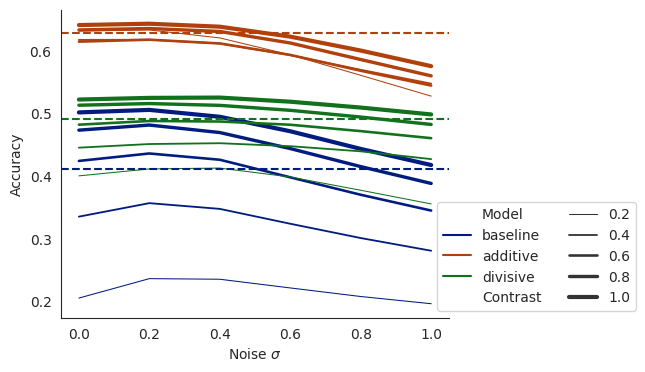

In [65]:
palette = sns.color_palette('dark')
plt.figure(figsize=(5, 4))
sns.lineplot(data=normal_acc, x='Noise $\sigma$', y='Accuracy', hue='Model', size='Contrast', palette=palette)
# dashed h line
plt.axhline(y=orig_acc[orig_acc.name=='baseline'].test_acc.values.mean(), color=palette[0], linestyle='--')
plt.axhline(y=orig_acc[orig_acc.name=='additive'].test_acc.values.mean(), color=palette[1], linestyle='--')
plt.axhline(y=orig_acc[orig_acc.name=='divisive'].test_acc.values.mean(), color=palette[2], linestyle='--')

# legend bottom
plt.legend(bbox_to_anchor=(1.5, 0), loc='lower right', ncol=2)

sns.despine()

plt.savefig('figures/noise_005.pdf', bbox_inches='tight')
plt.savefig('figures/noise_005.png', bbox_inches='tight')
plt.savefig('figures/noise_005.svg', bbox_inches='tight')

# different noise mean

wandb: Currently logged in as: georglange. Use `wandb login --relogin` to force relogin


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached datas

Testing: 0it [00:00, ?it/s]

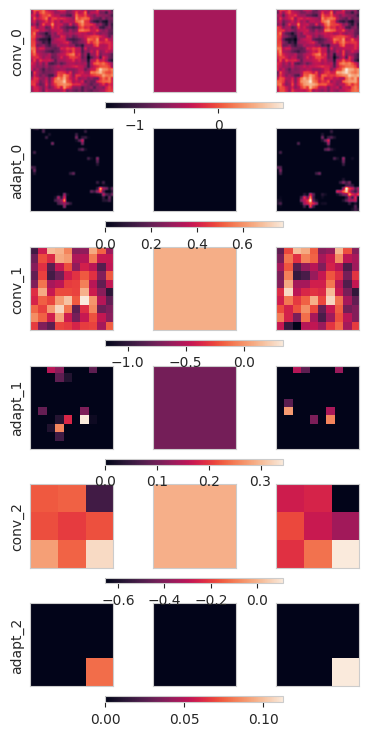

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

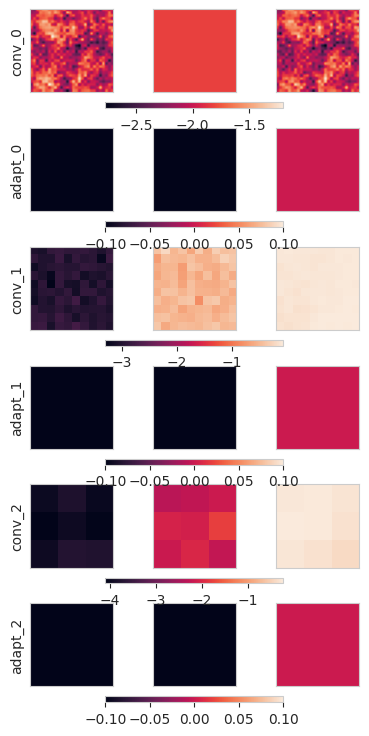

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

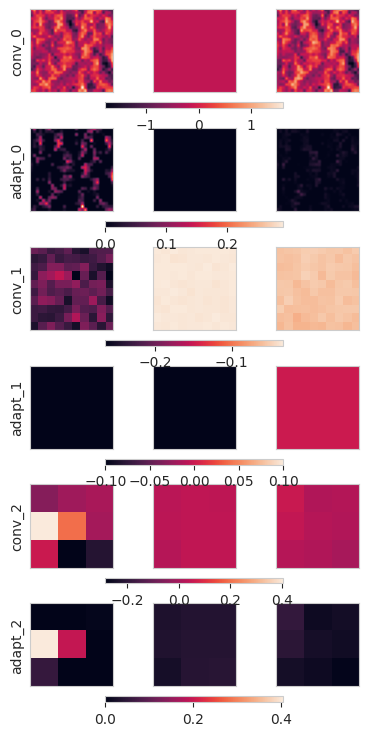

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached datas

Testing: 0it [00:00, ?it/s]

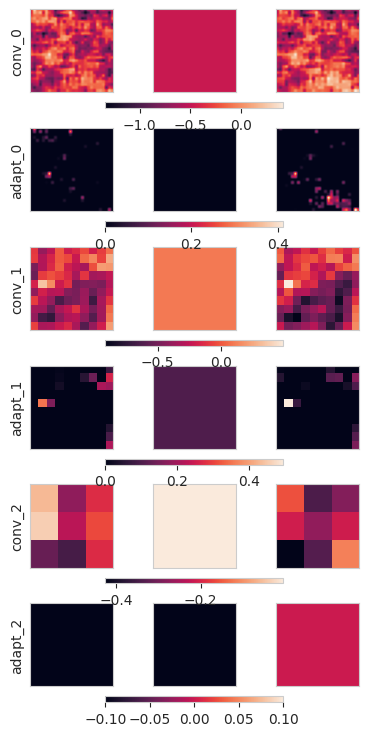

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

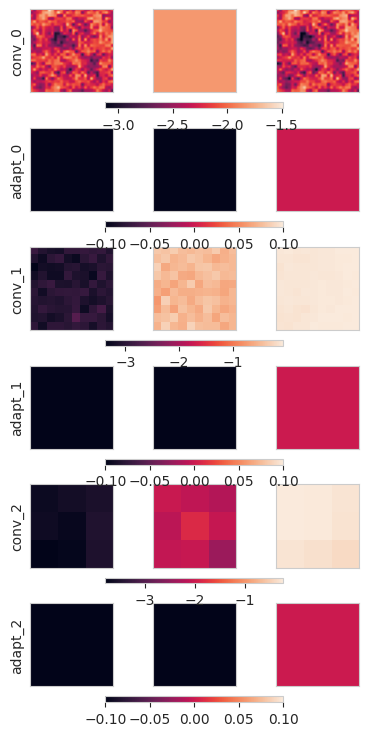

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

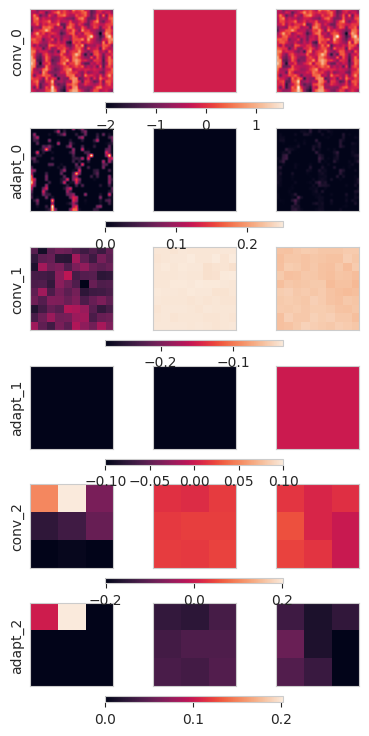

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached datas

Testing: 0it [00:00, ?it/s]

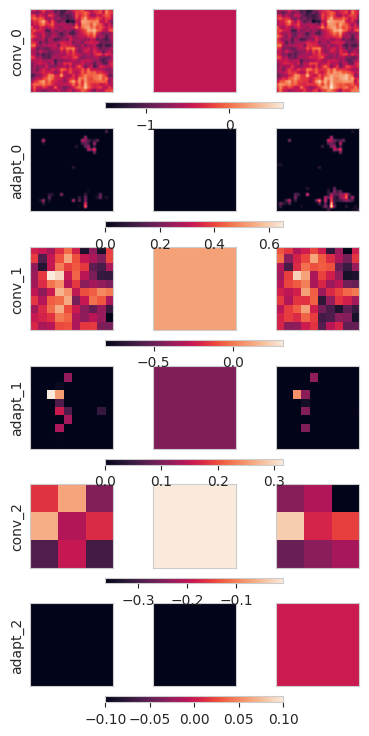

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

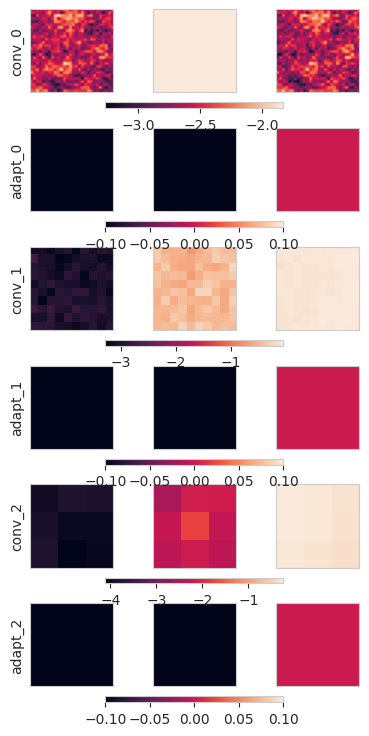

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

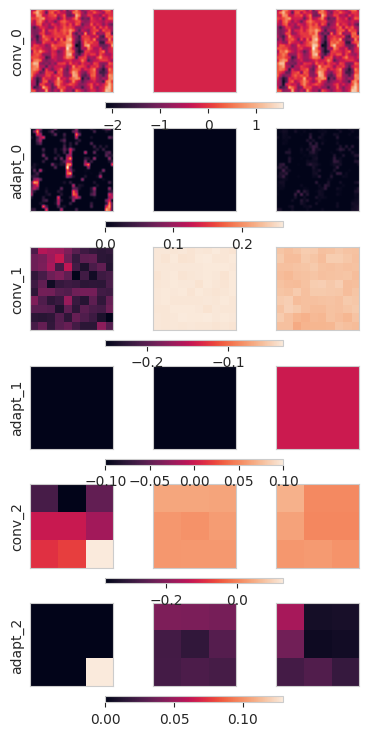

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached datas

Testing: 0it [00:00, ?it/s]

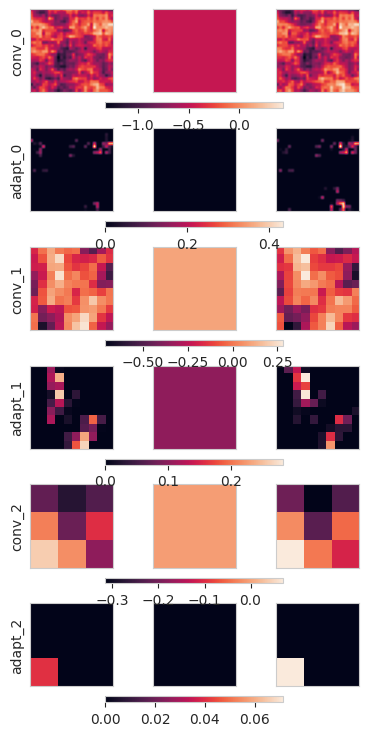

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

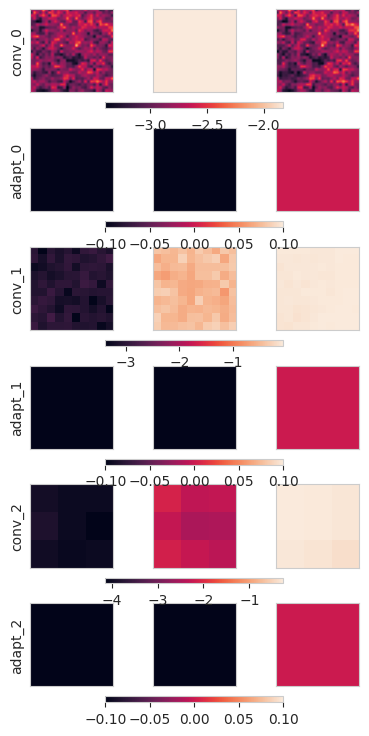

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

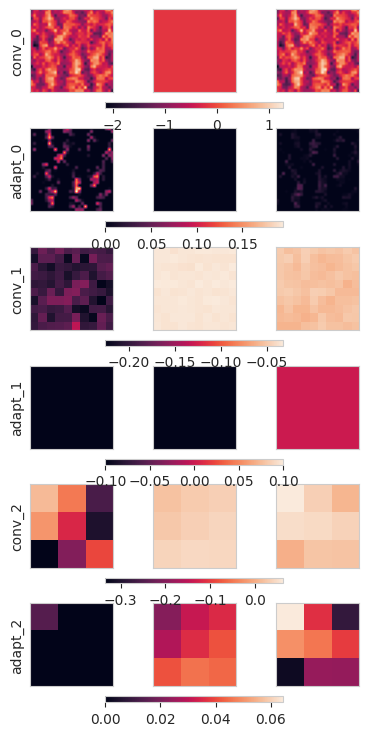

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached datas

Testing: 0it [00:00, ?it/s]

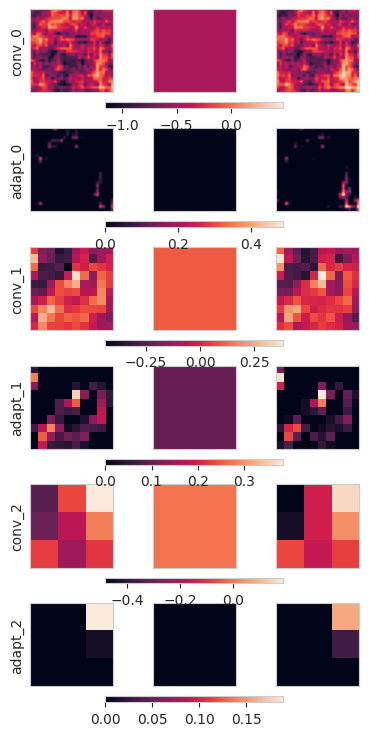

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

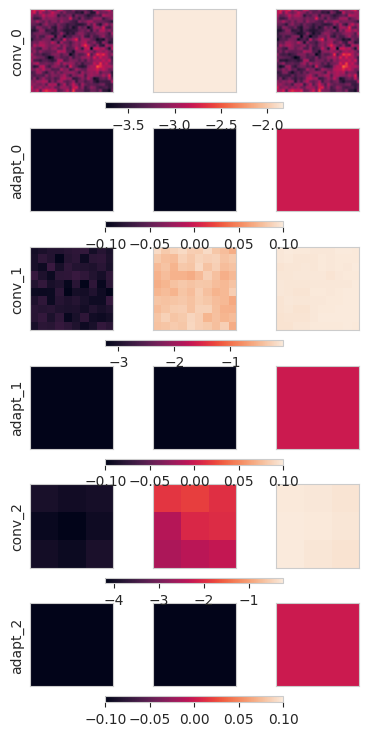

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

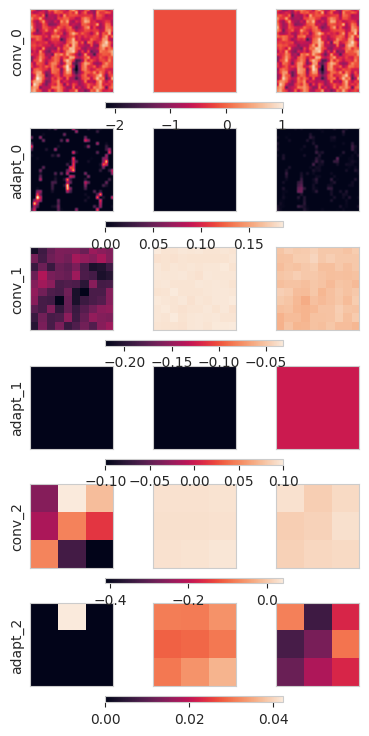

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached datas

Testing: 0it [00:00, ?it/s]

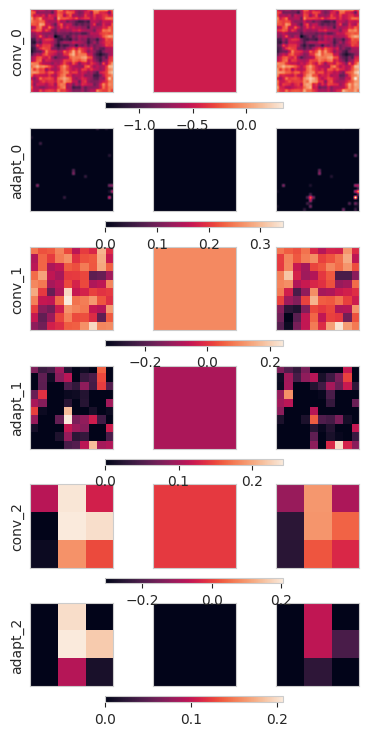

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

wandb: WARNING A graphql request initiated by the public wandb API timed out (timeout=19 sec). Create a new API with an integer timeout larger than 19, e.g., `api = wandb.Api(timeout=29)` to increase the graphql timeout.
wandb: WARNING A graphql request initiated by the public wandb API timed out (timeout=19 sec). Create a new API with an integer timeout larger than 19, e.g., `api = wandb.Api(timeout=29)` to increase the graphql timeout.
wandb: WARNING A graphql request initiated by the public wandb API timed out (timeout=19 sec). Create a new API with an integer timeout larger than 19, e.g., `api = wandb.Api(timeout=29)` to increase the graphql timeout.
wandb: WARNING A graphql request initiated by the public wandb API timed out (timeout=19 sec). Create a new API with an integer timeout larger than 19, e.g., `api = wandb.Api(timeout=29)` to increase the graphql timeout.
wandb: WARNING A graphql request initiated by the public wandb API timed out (timeout=19 sec). Create a new API with

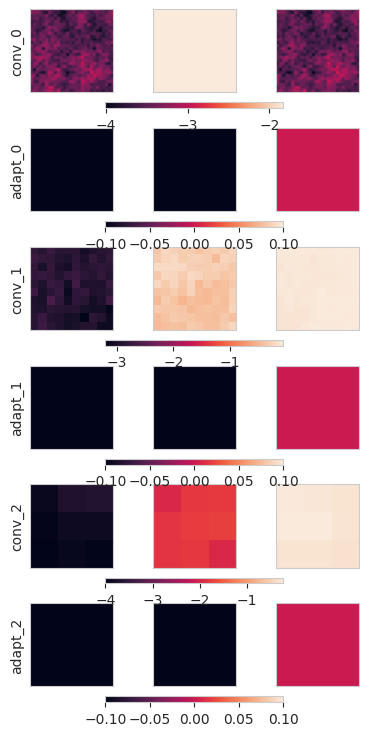

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

wandb: Network error (ReadTimeout), entering retry loop.
wandb: Network error (ReadTimeout), entering retry loop.
wandb: Network error (ReadTimeout), entering retry loop.
wandb: WARNING A graphql request initiated by the public wandb API timed out (timeout=19 sec). Create a new API with an integer timeout larger than 19, e.g., `api = wandb.Api(timeout=29)` to increase the graphql timeout.
wandb: Network error (ReadTimeout), entering retry loop.
wandb: WARNING A graphql request initiated by the public wandb API timed out (timeout=19 sec). Create a new API with an integer timeout larger than 19, e.g., `api = wandb.Api(timeout=29)` to increase the graphql timeout.
wandb: Network error (ReadTimeout), entering retry loop.
wandb: WARNING A graphql request initiated by the public wandb API timed out (timeout=19 sec). Create a new API with an integer timeout larger than 19, e.g., `api = wandb.Api(timeout=29)` to increase the graphql timeout.
wandb: WARNING A graphql request initiated by the pu

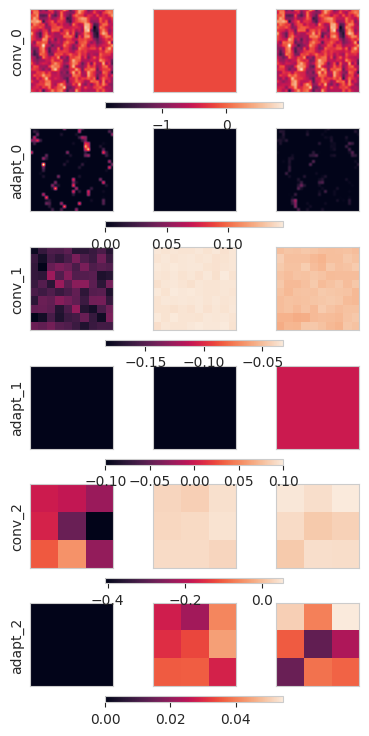

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

wandb: Network error (ReadTimeout), entering retry loop.
wandb: Network error (ReadTimeout), entering retry loop.


NameError: name 'pd' is not defined

In [7]:
wandb_logger = pl.loggers.WandbLogger(project='ai-thesis', config=config,
                                                      name=f'del')
trainer = pl.Trainer(logger=wandb_logger)
results = {'name': [], 'test_acc': [], 'contrast': [], 'repeat_noise': [], 'noise_offset': []}
noise_std = 0.4
for noise_offset in [0, 0.1, 0.2, 0.3, 0.4, 0.5]:
    train_loader, test_loader, train_dataset, test_dataset = get_dataloaders('cifar10', noise_type='normal', noise_std=noise_std, noise_mean_offset=noise_offset)
    for name, model in models.items():
        res = trainer.test(model, test_loader, verbose=False)
        for contrast in [0.2, 0.4, 0.6, 0.8, 1.0]:
            results['name'].append(name)
            results['test_acc'].append(res[0][f'acc/{contrast}_True'])
            results['contrast'].append(contrast)
            results['repeat_noise'].append(True)
            results['noise_offset'].append(noise_offset)
normal_offset_acc = pd.DataFrame(results)
normal_offset_acc

In [ ]:
normal_offset_acc = normal_offset_acc.rename(
    columns={'name': 'Model', 'test_acc': 'Accuracy', 'contrast': 'Contrast', 'repeat_noise': 'Repeat Noise',
             'noise_offset': 'Noise Offset'})
palette = sns.color_palette('dark')
plt.figure(figsize=(5, 4))
sns.lineplot(data=normal_offset_acc, x='Noise Offset', y='Accuracy', hue='Model', size='Contrast', palette=palette)
plt.xlabel('Normal + Offset')
# dashed h line
plt.axhline(y=orig_acc[orig_acc.name == 'baseline'].test_acc.values.mean(), color=palette[0], linestyle='--')
plt.axhline(y=orig_acc[orig_acc.name == 'additive'].test_acc.values.mean(), color=palette[1], linestyle='--')
plt.axhline(y=orig_acc[orig_acc.name == 'divisive'].test_acc.values.mean(), color=palette[2], linestyle='--')

# legend bottom
plt.legend(bbox_to_anchor=(1.5, 0), loc='lower right', ncol=2)

sns.despine()

plt.savefig('figures/noise_006.pdf', bbox_inches='tight')
plt.savefig('figures/noise_006.png', bbox_inches='tight')
plt.savefig('figures/noise_006.svg', bbox_inches='tight')

In [9]:
models['divisive'].model.adapt_layers[0].alpha, models['divisive'].model.adapt_layers[0].sigma, models['divisive'].model.adapt_layers[0].K


(Parameter containing:
 tensor(-2.1349, requires_grad=True),
 Parameter containing:
 tensor(0.0223, requires_grad=True),
 Parameter containing:
 tensor(0.0041, requires_grad=True))

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/pytorch_lightning/loggers/wandb.py:395: UserWarning:

There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/

Testing: 0it [00:00, ?it/s]

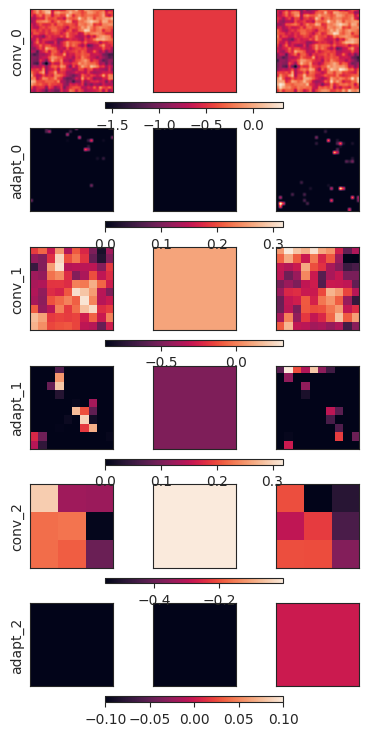

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

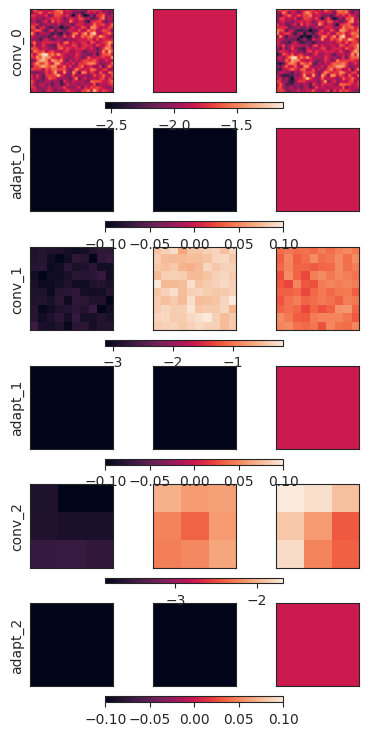

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

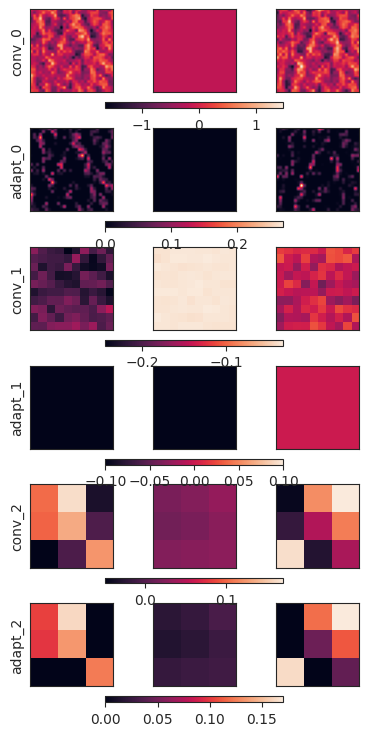

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached datas

Testing: 0it [00:00, ?it/s]

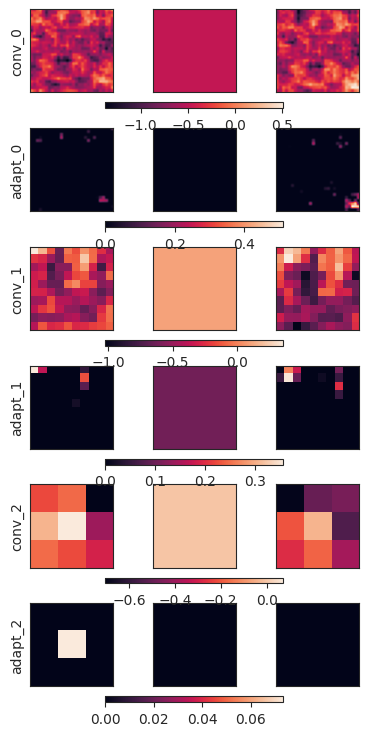

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

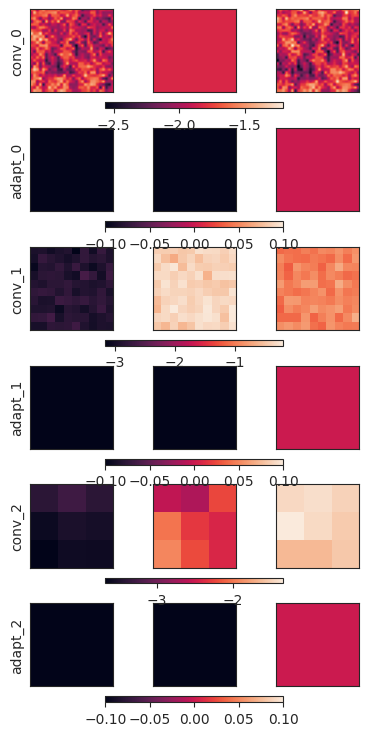

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

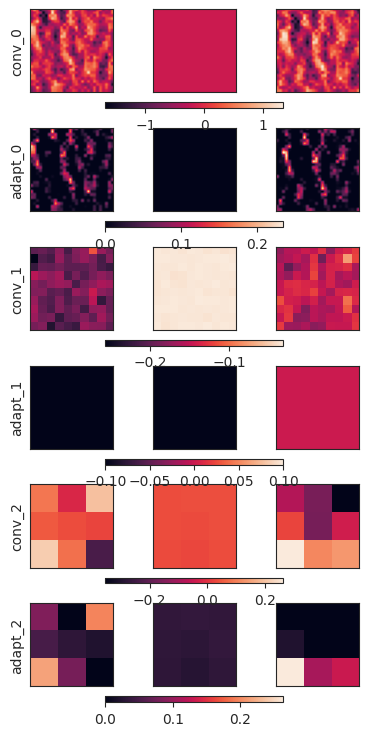

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached datas

Testing: 0it [00:00, ?it/s]

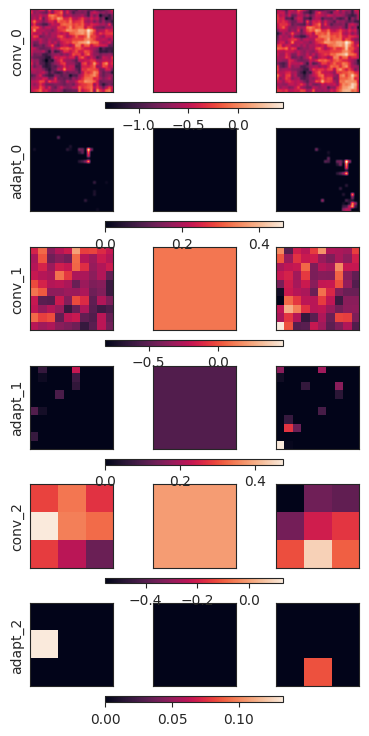

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

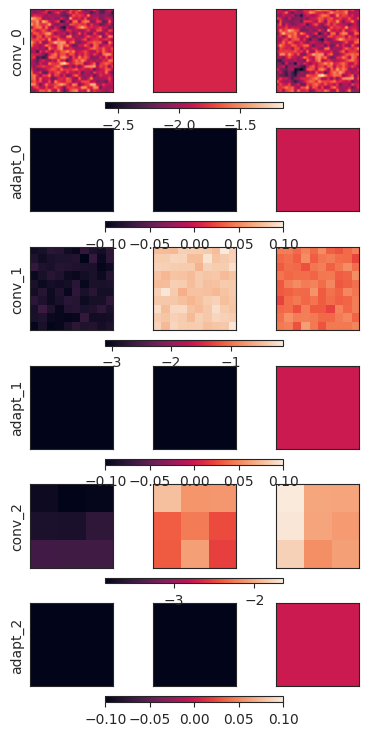

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

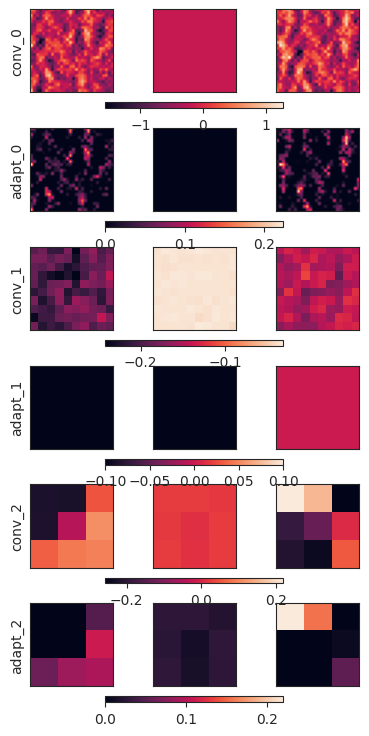

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached datas

Testing: 0it [00:00, ?it/s]

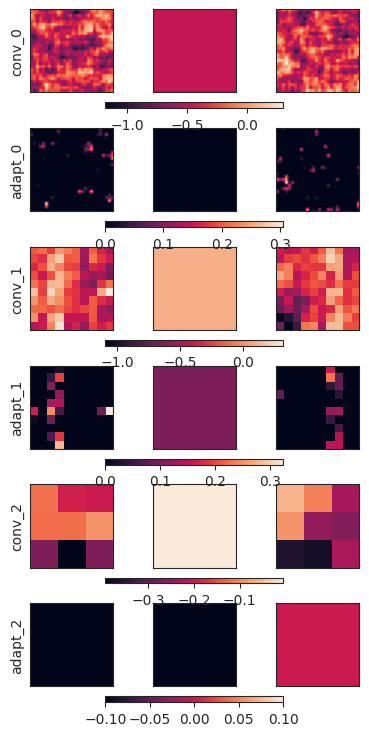

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

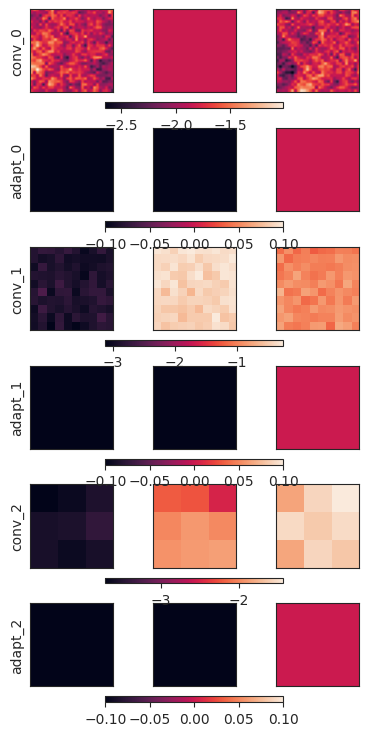

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

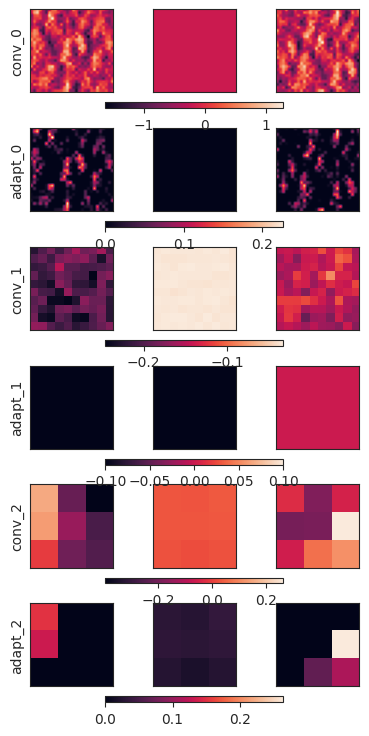

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached datas

Testing: 0it [00:00, ?it/s]

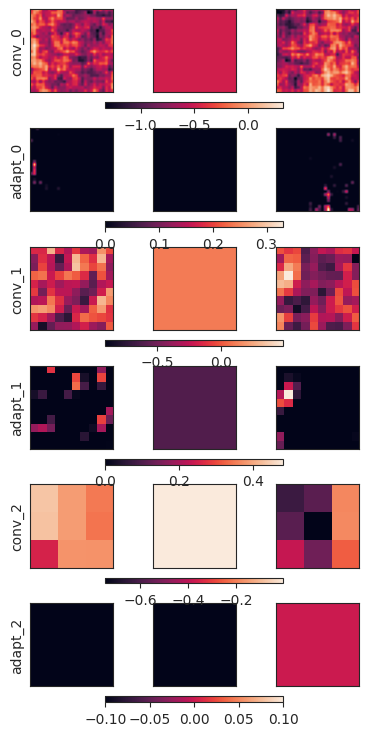

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

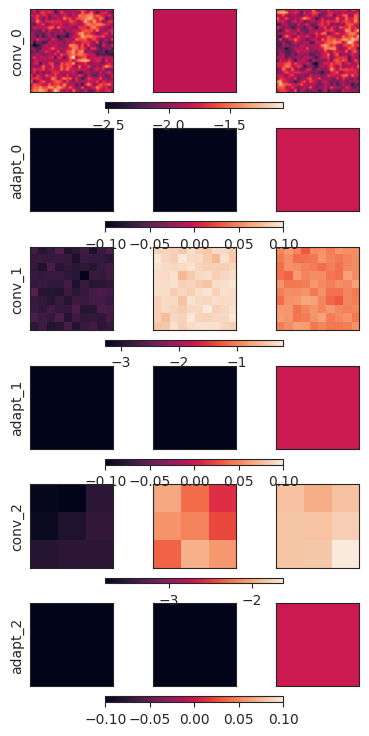

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [2]


Testing: 0it [00:00, ?it/s]

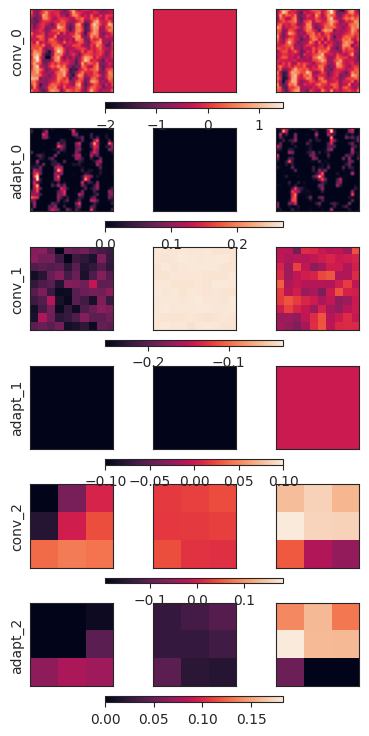

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



,name,test_acc,contrast,repeat_noise,noise_offset
0,baseline,0.220394,0.2,True,1
1,baseline,0.308340,0.4,True,1
2,baseline,0.373882,0.6,True,1
3,baseline,0.416382,0.8,True,1
4,baseline,0.444888,1.0,True,1
...,...,...,...,...,...
70,divisive,0.312779,0.2,True,16
71,divisive,0.382079,0.4,True,16
72,divisive,0.420816,0.6,True,16
73,divisive,0.448042,0.8,True,16


In [74]:
wandb_logger = pl.loggers.WandbLogger(project='ai-thesis', config=config,
                                                      name=f'del')
trainer = pl.Trainer(logger=wandb_logger)
results = {'name': [], 'test_acc': [], 'contrast': [], 'repeat_noise': [], 'noise_offset': []}
for noise_offset in [1, 2, 4, 8, 16]:
    train_loader, test_loader, train_dataset, test_dataset = get_dataloaders('cifar10', noise_offset=noise_offset)
    for name, model in models.items():
        res = trainer.test(model, test_loader, verbose=False)
        for contrast in [0.2, 0.4, 0.6, 0.8, 1.0]:
            results['name'].append(name)
            results['test_acc'].append(res[0][f'acc/{contrast}_True'])
            results['contrast'].append(contrast)
            results['repeat_noise'].append(True)
            results['noise_offset'].append(noise_offset)
offset_acc = pd.DataFrame(results)
offset_acc

In [ ]:
sns.barplot(data=offset_acc, x='name', y='test_acc', hue='contrast')


/tmp/ipykernel_1173019/938646131.py:6: UserWarning:

The palette list has more values (10) than needed (3), which may not be intended.



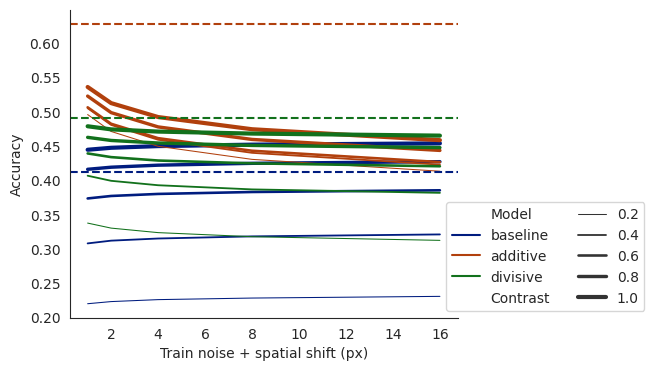

In [75]:
offset_acc = offset_acc.rename(
    columns={'name': 'Model', 'test_acc': 'Accuracy', 'contrast': 'Contrast', 'repeat_noise': 'Repeat Noise',
             'noise_offset': 'Noise Offset'})
palette = sns.color_palette('dark')
plt.figure(figsize=(5, 4))
sns.lineplot(data=offset_acc, x='Noise Offset', y='Accuracy', hue='Model', size='Contrast', palette=palette)
plt.xlabel('Train noise + spatial shift (px)')
# dashed h line
plt.axhline(y=orig_acc[orig_acc.name == 'baseline'].test_acc.values.mean(), color=palette[0], linestyle='--')
plt.axhline(y=orig_acc[orig_acc.name == 'additive'].test_acc.values.mean(), color=palette[1], linestyle='--')
plt.axhline(y=orig_acc[orig_acc.name == 'divisive'].test_acc.values.mean(), color=palette[2], linestyle='--')

# legend bottom
plt.legend(bbox_to_anchor=(1.5, 0), loc='lower right', ncol=2)

sns.despine()

plt.savefig('figures/noise_007.pdf', bbox_inches='tight')
plt.savefig('figures/noise_007.png', bbox_inches='tight')
plt.savefig('figures/noise_007.svg', bbox_inches='tight')


# Trained on maximum contrast

In [4]:
# load model
with open('config.json', 'r') as f:
    config = json.load(f)
hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_cifar10'], ExponentialDecay, 
                                [
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False},
    {"alpha_init":  1.0, "train_alpha": False, "beta_init": 1, "train_beta": False}
  ]
                                )
model = Adaptation.load_from_checkpoint(
    'learned_models/baseline_generalization_cifar_ExponentialDecay_contrast_1.0_repeat_noise_True_epoch_20.ckpt', model=hooked_cnn)

models = {}
models['baseline'] = model

additive_hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_cifar10'], ExponentialDecay,
                                config['adaptation_kwargs_additive'])
additive_model = Adaptation.load_from_checkpoint(
    'learned_models/generalization_cifar_ExponentialDecay_contrast_1.0_repeat_noise_True_epoch_20.ckpt',
    model=additive_hooked_cnn)
models['additive'] = additive_model

divisive_hooked_cnn = HookedRecursiveCNN(3, config['layer_kwargs_cifar10'], DivisiveNorm,
                                config['adaptation_kwargs_div_norm'])
divisive_model = Adaptation.load_from_checkpoint(
    'learned_models/generalization_cifar_DivisiveNorm_contrast_1.0_repeat_noise_True_epoch_20.ckpt',
    model=divisive_hooked_cnn)
models['divisive'] = divisive_model


Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Foun

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


baseline


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


Testing: 0it [00:00, ?it/s]

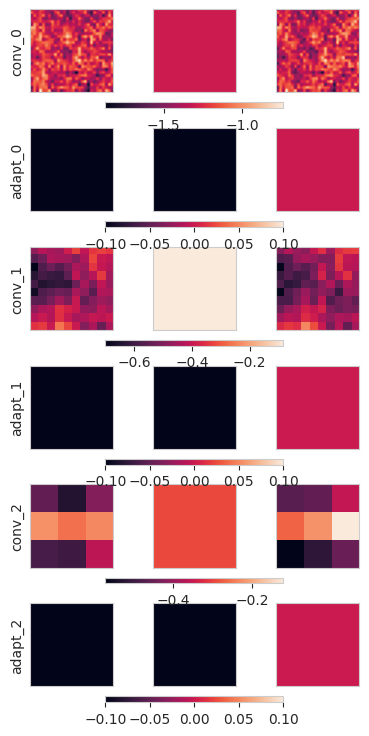

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.18219999969005585    │
│       acc/0.2_True        │    0.17739999294281006    │
│       acc/0.4_False       │    0.2824999988079071     │
│       acc/0.4_True        │    0.28049999475479126    │
│       acc/0.6_False       │    0.3991999924182892     │
│       acc/0.6_True        │    0.3986000120639801     │
│       acc/0.8_False       │    0.4977000057697296     │
│       acc/0.8_True        │    0.5037000179290771     │
│       acc/1.0_False       │    0.5404000282287598     │
│       acc/1.0_True        │    0.5436999797821045     │
│       acc_diff/0.2        │   -0.004800000227987766   │
│       acc_diff/0.4        │  -0.0020000000949949026   │
│       acc_diff/0.6        │  -0.0006000000284984708   │
│       acc_diff/0.8        │   0.006000000052154064    │
│       acc_diff/1.0        │   0.0032999999821186066   │
│   cum_actv_diff/0.2_l0    │  -3.1672039767727256e-05  │
│   cum_actv_diff/0.2_l1    │  -9.472714009461924e-05   │
│   cum_actv_diff/0.2_l2    │  -0.00016404941561631858  │
│   cum_actv_diff/0.4_l0    │  -5.417336069513112e-06   │
│   cum_actv_diff/0.4_l1    │  -4.838299719267525e-05   │
│   cum_actv_diff/0.4_l2    │   9.253543248632923e-05   │
│   cum_actv_diff/0.6_l0    │  -1.3542100532504264e-05  │
│   cum_actv_diff/0.6_l1    │  -3.753273267648183e-05   │
│   cum_actv_diff/0.6_l2    │  3.5534998460207134e-05   │
│   cum_actv_diff/0.8_l0    │   3.718895823112689e-05   │
│   cum_actv_diff/0.8_l1    │   2.737446266110055e-05   │
│   cum_actv_diff/0.8_l2    │  2.2593914764001966e-05   │
│   cum_actv_diff/1.0_l0    │   5.147585034137592e-05   │
│   cum_actv_diff/1.0_l1    │   4.138630538363941e-05   │
│   cum_actv_diff/1.0_l2    │  0.00016541693184990436   │
│         test_acc          │    0.3805899918079376     │
│         test_loss         │     1.826108694076538     │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


additive


Testing: 0it [00:00, ?it/s]

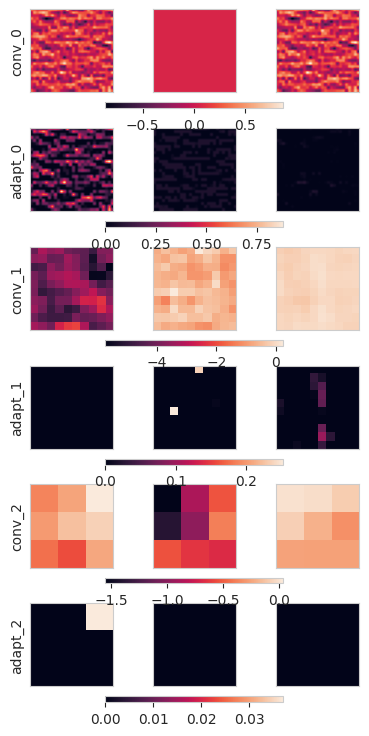

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.16869999468326569    │
│       acc/0.2_True        │    0.15839999914169312    │
│       acc/0.4_False       │    0.20239999890327454    │
│       acc/0.4_True        │    0.32199999690055847    │
│       acc/0.6_False       │    0.23029999434947968    │
│       acc/0.6_True        │    0.5342000126838684     │
│       acc/0.8_False       │    0.2689000070095062     │
│       acc/0.8_True        │    0.6424000263214111     │
│       acc/1.0_False       │    0.29330000281333923    │
│       acc/1.0_True        │    0.6826000213623047     │
│       acc_diff/0.2        │   -0.010300000198185444   │
│       acc_diff/0.4        │    0.11959999799728394    │
│       acc_diff/0.6        │    0.30390000343322754    │
│       acc_diff/0.8        │    0.3734999895095825     │
│       acc_diff/1.0        │    0.38929998874664307    │
│   cum_actv_diff/0.2_l0    │   0.040526311844587326    │
│   cum_actv_diff/0.2_l1    │   -0.009655579924583435   │
│   cum_actv_diff/0.2_l2    │   0.010795213282108307    │
│   cum_actv_diff/0.4_l0    │    0.03912746161222458    │
│   cum_actv_diff/0.4_l1    │   -0.006165676284581423   │
│   cum_actv_diff/0.4_l2    │    0.01125341933220625    │
│   cum_actv_diff/0.6_l0    │   0.036646176129579544    │
│   cum_actv_diff/0.6_l1    │   -0.006806348450481892   │
│   cum_actv_diff/0.6_l2    │   0.011184376664459705    │
│   cum_actv_diff/0.8_l0    │    0.03392728418111801    │
│   cum_actv_diff/0.8_l1    │   -0.008334719575941563   │
│   cum_actv_diff/0.8_l2    │   0.010715611279010773    │
│   cum_actv_diff/1.0_l0    │    0.03101065196096897    │
│   cum_actv_diff/1.0_l1    │   -0.009789378382265568   │
│   cum_actv_diff/1.0_l2    │   0.009884347207844257    │
│         test_acc          │    0.3503200113773346     │
│         test_loss         │     2.384993553161621     │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


divisive


Testing: 0it [00:00, ?it/s]

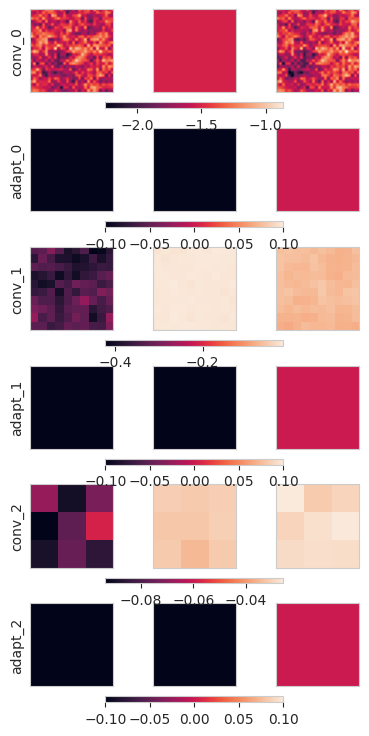

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.14030000567436218    │
│       acc/0.2_True        │    0.08659999817609787    │
│       acc/0.4_False       │    0.1687999963760376     │
│       acc/0.4_True        │    0.17970000207424164    │
│       acc/0.6_False       │     0.195700004696846     │
│       acc/0.6_True        │    0.36640000343322754    │
│       acc/0.8_False       │    0.2249000072479248     │
│       acc/0.8_True        │    0.49559998512268066    │
│       acc/1.0_False       │    0.2551000118255615     │
│       acc/1.0_True        │    0.5371000170707703     │
│       acc_diff/0.2        │   -0.053700000047683716   │
│       acc_diff/0.4        │   0.010900000110268593    │
│       acc_diff/0.6        │    0.17069999873638153    │
│       acc_diff/0.8        │    0.27070000767707825    │
│       acc_diff/1.0        │    0.28200000524520874    │
│   cum_actv_diff/0.2_l0    │   0.0041159698739647865   │
│   cum_actv_diff/0.2_l1    │   0.0028389892540872097   │
│   cum_actv_diff/0.2_l2    │   0.001632224302738905    │
│   cum_actv_diff/0.4_l0    │   0.004100190941244364    │
│   cum_actv_diff/0.4_l1    │   0.003487330861389637    │
│   cum_actv_diff/0.4_l2    │   0.0025283093564212322   │
│   cum_actv_diff/0.6_l0    │   0.0039570629596710205   │
│   cum_actv_diff/0.6_l1    │   0.0035681643057614565   │
│   cum_actv_diff/0.6_l2    │   0.0029715877026319504   │
│   cum_actv_diff/0.8_l0    │   0.0037922475021332502   │
│   cum_actv_diff/0.8_l1    │   0.0033884153235703707   │
│   cum_actv_diff/0.8_l2    │   0.0030044622253626585   │
│   cum_actv_diff/1.0_l0    │   0.0036053257063031197   │
│   cum_actv_diff/1.0_l1    │   0.0030883457511663437   │
│   cum_actv_diff/1.0_l2    │   0.0028817933052778244   │
│         test_acc          │    0.2650200128555298     │
│         test_loss         │     3.031289577484131     │
└───────────────────────────┴───────────────────────────┘

<Axes: xlabel='name', ylabel='test_acc'>

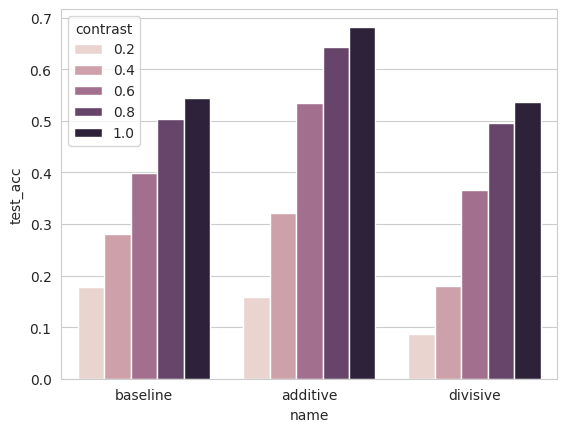

In [5]:
train_loader, test_loader, train_dataset, test_dataset = get_dataloaders('cifar10')
wandb_logger = pl.loggers.WandbLogger(project='ai-thesis', config=config,
                                      name=f'del')
trainer = pl.Trainer(logger=wandb_logger)
results = {'name': [], 'test_acc': [], 'contrast': []}
for name, model in models.items():
    print(name)
    res = trainer.test(model, test_loader)
    for contrast in [0.2, 0.4, 0.6, 0.8, 1.0]:
        results['name'].append(name)
        results['test_acc'].append(res[0][f'acc/{contrast}_True'])
        results['contrast'].append(contrast)

import seaborn as sns

sns.barplot(x='name', y='test_acc', data=results, hue='contrast')

Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Found cached dataset cifar10 (/var/local/glang/.cache/huggingface/datasets/cifar10/plain_text/1.0.0/447d6ec4733dddd1ce3bb577c7166b986eaa4c538dcd9e805ba61f35674a9de4)
Foun

baseline


Testing: 0it [00:00, ?it/s]

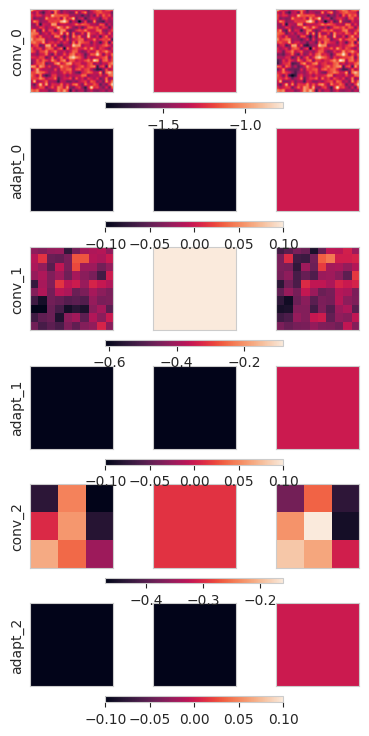

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.18264999985694885    │
│       acc/0.2_True        │    0.1780499964952469     │
│       acc/0.4_False       │     0.274399995803833     │
│       acc/0.4_True        │    0.27924999594688416    │
│       acc/0.6_False       │     0.399399995803833     │
│       acc/0.6_True        │    0.3977999985218048     │
│       acc/0.8_False       │    0.4989500045776367     │
│       acc/0.8_True        │    0.5038999915122986     │
│       acc/1.0_False       │    0.5412499904632568     │
│       acc/1.0_True        │    0.5458999872207642     │
│       acc_diff/0.2        │   -0.004600000102072954   │
│       acc_diff/0.4        │   0.0048500001430511475   │
│       acc_diff/0.6        │  -0.0015999999595806003   │
│       acc_diff/0.8        │    0.00494999997317791    │
│       acc_diff/1.0        │   0.004650000017136335    │
│   cum_actv_diff/0.2_l0    │  -3.122513589914888e-05   │
│   cum_actv_diff/0.2_l1    │  -8.874144987203181e-05   │
│   cum_actv_diff/0.2_l2    │  -0.00014056569489184767  │
│   cum_actv_diff/0.4_l0    │  -2.2824713141744724e-06  │
│   cum_actv_diff/0.4_l1    │  -2.8616546842386015e-05  │
│   cum_actv_diff/0.4_l2    │   4.070090290042572e-05   │
│   cum_actv_diff/0.6_l0    │  -1.772721043380443e-05   │
│   cum_actv_diff/0.6_l1    │  1.4917653061274905e-05   │
│   cum_actv_diff/0.6_l2    │  -1.8273020032211207e-05  │
│   cum_actv_diff/0.8_l0    │   4.133539187023416e-05   │
│   cum_actv_diff/0.8_l1    │  2.0492456314968877e-05   │
│   cum_actv_diff/0.8_l2    │  2.1443836885737255e-05   │
│   cum_actv_diff/1.0_l0    │   4.901536522083916e-05   │
│   cum_actv_diff/1.0_l1    │  5.5251395679078996e-05   │
│   cum_actv_diff/1.0_l2    │  0.00011262940824963152   │
│         test_acc          │     0.379720002412796     │
│         test_loss         │    1.8286648988723755     │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


additive


Testing: 0it [00:00, ?it/s]

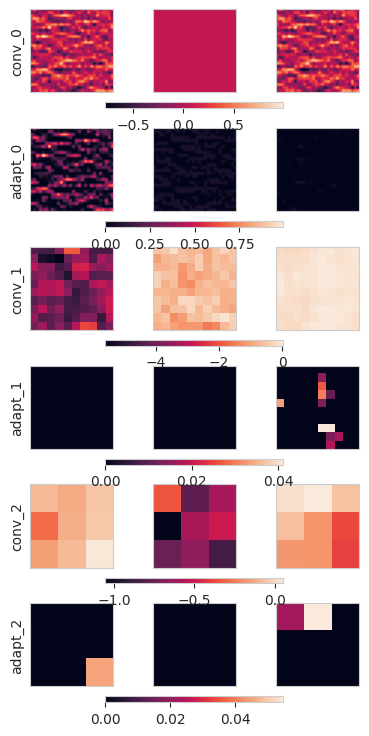

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.1678999960422516     │
│       acc/0.2_True        │    0.1597999930381775     │
│       acc/0.4_False       │    0.20344999432563782    │
│       acc/0.4_True        │    0.32109999656677246    │
│       acc/0.6_False       │    0.23235000669956207    │
│       acc/0.6_True        │    0.5326499938964844     │
│       acc/0.8_False       │    0.2671999931335449     │
│       acc/0.8_True        │    0.6424999833106995     │
│       acc/1.0_False       │    0.29429998993873596    │
│       acc/1.0_True        │    0.6843500137329102     │
│       acc_diff/0.2        │   -0.008100000210106373   │
│       acc_diff/0.4        │    0.11765000224113464    │
│       acc_diff/0.6        │    0.3003000020980835     │
│       acc_diff/0.8        │    0.37529999017715454    │
│       acc_diff/1.0        │    0.3900499939918518     │
│   cum_actv_diff/0.2_l0    │    0.04053265601396561    │
│   cum_actv_diff/0.2_l1    │   -0.009663090109825134   │
│   cum_actv_diff/0.2_l2    │   0.010781151242554188    │
│   cum_actv_diff/0.4_l0    │   0.039135146886110306    │
│   cum_actv_diff/0.4_l1    │   -0.006159552372992039   │
│   cum_actv_diff/0.4_l2    │   0.011266419664025307    │
│   cum_actv_diff/0.6_l0    │   0.036634691059589386    │
│   cum_actv_diff/0.6_l1    │   -0.006812966428697109   │
│   cum_actv_diff/0.6_l2    │   0.011176582425832748    │
│   cum_actv_diff/0.8_l0    │    0.03392328694462776    │
│   cum_actv_diff/0.8_l1    │   -0.008338883519172668   │
│   cum_actv_diff/0.8_l2    │    0.01069481298327446    │
│   cum_actv_diff/1.0_l0    │   0.031019553542137146    │
│   cum_actv_diff/1.0_l1    │   -0.009773106314241886   │
│   cum_actv_diff/1.0_l2    │   0.009874720126390457    │
│         test_acc          │    0.3508000075817108     │
│         test_loss         │    2.3860042095184326     │
└───────────────────────────┴───────────────────────────┘

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]


divisive


Testing: 0it [00:00, ?it/s]

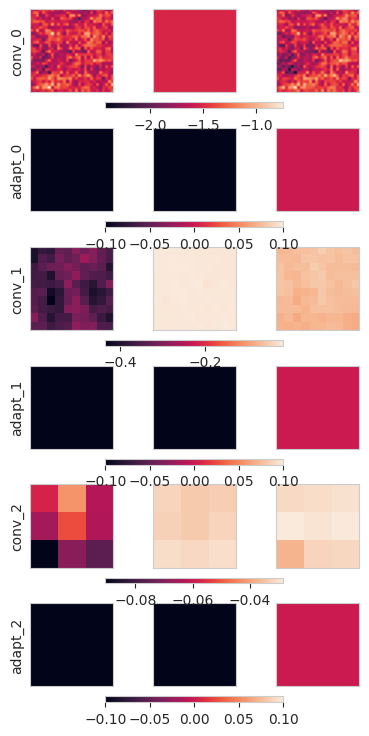

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:571: UserWarning:

Dang! That path collection is out of this world. I totally don't know what to do with it yet! Plotly can only import path collections linked to 'data' coordinates

/var/local/glang/anaconda3/envs/ai-thesis/lib/python3.10/site-packages/plotly/matplotlylib/renderer.py:609: UserWarning:

I found a path object that I don't think is part of a bar chart. Ignoring.



┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       acc/0.2_False       │    0.14225000143051147    │
│       acc/0.2_True        │    0.08715000003576279    │
│       acc/0.4_False       │    0.17020000517368317    │
│       acc/0.4_True        │     0.178849995136261     │
│       acc/0.6_False       │    0.19609999656677246    │
│       acc/0.6_True        │    0.36500000953674316    │
│       acc/0.8_False       │    0.2243500053882599     │
│       acc/0.8_True        │    0.4969500005245209     │
│       acc/1.0_False       │    0.2562499940395355     │
│       acc/1.0_True        │     0.537850022315979     │
│       acc_diff/0.2        │   -0.05510000139474869    │
│       acc_diff/0.4        │    0.00865000020712614    │
│       acc_diff/0.6        │    0.1688999980688095     │
│       acc_diff/0.8        │     0.272599995136261     │
│       acc_diff/1.0        │    0.2815999984741211     │
│   cum_actv_diff/0.2_l0    │   0.004118714481592178    │
│   cum_actv_diff/0.2_l1    │   0.002832066500559449    │
│   cum_actv_diff/0.2_l2    │   0.0016079760389402509   │
│   cum_actv_diff/0.4_l0    │   0.004100284539163113    │
│   cum_actv_diff/0.4_l1    │   0.003482787637040019    │
│   cum_actv_diff/0.4_l2    │   0.002539576729759574    │
│   cum_actv_diff/0.6_l0    │   0.0039580222219228745   │
│   cum_actv_diff/0.6_l1    │   0.0035588291939347982   │
│   cum_actv_diff/0.6_l2    │   0.0029473244212567806   │
│   cum_actv_diff/0.8_l0    │   0.0037936458829790354   │
│   cum_actv_diff/0.8_l1    │   0.003386924508959055    │
│   cum_actv_diff/0.8_l2    │   0.0030070561915636063   │
│   cum_actv_diff/1.0_l0    │   0.0036064430605620146   │
│   cum_actv_diff/1.0_l1    │   0.0030919252894818783   │
│   cum_actv_diff/1.0_l2    │   0.002891774056479335    │
│         test_acc          │    0.26596999168395996    │
│         test_loss         │     3.022243022918701     │
└───────────────────────────┴───────────────────────────┘

<Axes: xlabel='name', ylabel='test_acc'>

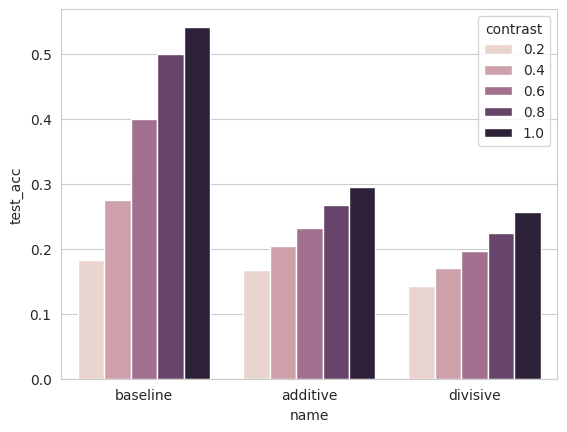

In [6]:
train_loader, test_loader, train_dataset, test_dataset = get_dataloaders('cifar10')
wandb_logger = pl.loggers.WandbLogger(project='ai-thesis', config=config,
                                      name=f'del')
trainer = pl.Trainer(logger=wandb_logger)
results = {'name': [], 'test_acc': [], 'contrast': []}
for name, model in models.items():
    print(name)
    res = trainer.test(model, test_loader)
    for contrast in [0.2, 0.4, 0.6, 0.8, 1.0]:
        results['name'].append(name)
        results['test_acc'].append(res[0][f'acc/{contrast}_False'])
        results['contrast'].append(contrast)

import seaborn as sns

sns.barplot(x='name', y='test_acc', data=results, hue='contrast')

In [9]:
models['divisive'].model.adapt_layers[0].alpha, models['divisive'].model.adapt_layers[0].sigma, models['divisive'].model.adapt_layers[0].K

(Parameter containing:
 tensor(-1.6051, requires_grad=True),
 Parameter containing:
 tensor(0.0276, requires_grad=True),
 Parameter containing:
 tensor(0.0067, requires_grad=True))

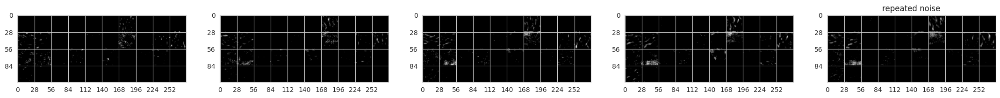

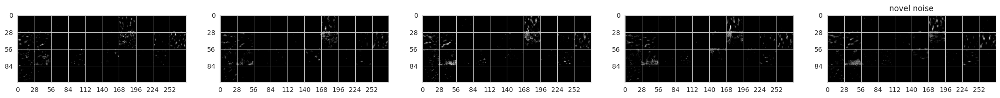

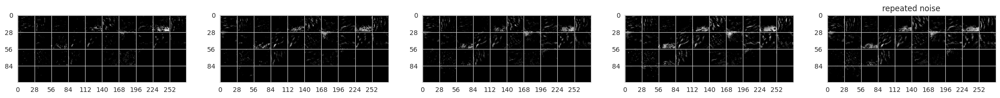

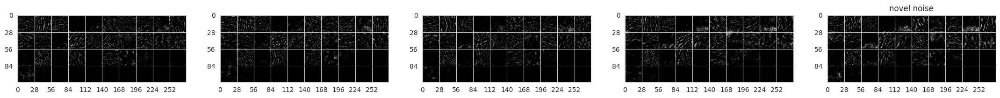

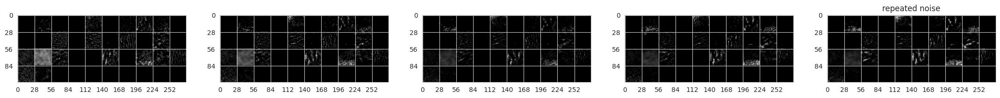

Text(0.5, 1.0, 'novel noise')

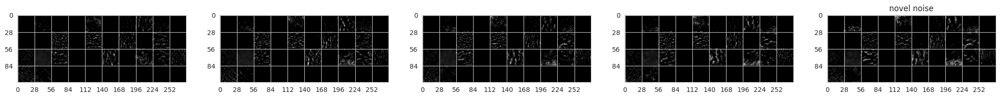

In [12]:
import matplotlib.pyplot as plt
import numpy as np
layer = 0
idx = 0
actvs_grid(models['baseline'], test_dataset, idx, layer)
plt.title('repeated noise')
plt.show()
actvs_grid(models['baseline'], test_dataset, idx + 50000, layer)
plt.title('novel noise')
plt.show()
actvs_grid(models['additive'], test_dataset, idx, layer)
plt.title('repeated noise')
plt.show()
actvs_grid(models['additive'], test_dataset, idx + 50000, layer)
plt.title('novel noise')
plt.show()
actvs_grid(models['divisive'], test_dataset, idx, layer)
plt.title('repeated noise')
plt.show()
actvs_grid(models['divisive'], test_dataset, idx + 50000, layer)
plt.title('novel noise')